In [1]:
from default import *

PORT = 5001
%cd -q {PROJECT_HOME}

In [2]:
import os
from copy import deepcopy

figure_dir = os.getcwd() + '/022025_experiment/figures'

import numpy as np
import torch
import mlflow
import matplotlib.pyplot as plt
from torch.utils.data import Subset
from copy import deepcopy
from torch.utils.data import DataLoader
from sklearn.model_selection import KFold
from models.architecture import MLP
from models.processing import StandardScaler
from torch import nn

import pandas as pd

import torch.nn.functional as F

from mlflow.pytorch import load_model

import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np

from losses import StiffnessToLoadLoss

import ast

import torchmetrics.functional.regression as R
from dataset import FixedPrattTrussDatasetSingleTarget

from concurrent.futures import ProcessPoolExecutor, ThreadPoolExecutor
from tools.mlflow import BasicDataset

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
device = torch.device(
    'cuda' if torch.cuda.is_available()
    else 'mps' if torch.backends.mps.is_available()
    else 'cpu'
)

In [4]:
# Load the datasets
_validation_ds = FixedPrattTrussDatasetSingleTarget("data/dataset/pratt_truss_bridge_isostatic/test/single_8192.hdf5")

# MSE Only

In [5]:
def train_step(model, batch, input_scaler, target_scaler, optimizer, criterion):
    model.train()

    input, target, _, _, _ = batch
    input, target = input.to(device), target.to(device)

    z_input = input_scaler.transform(input)
    z_target = target_scaler.transform(target)

    z_target_pred = model(z_input)
    target_pred = target_scaler.inverse_transform(z_target_pred)

    optimizer.zero_grad()
    loss = criterion(z_target_pred, z_target)
    loss.backward()
    optimizer.step()

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss'] = loss.item()

    return metrics


def validation(model, batch, input_scaler, target_scaler, criterion):
    model.eval()
    with torch.no_grad():
        input, target, _, _, _ = batch
        input, target = input.to(device), target.to(device)

        z_input = input_scaler.transform(input)
        z_target = target_scaler.transform(target)

        z_target_pred = model(z_input)
        target_pred = target_scaler.inverse_transform(z_target_pred)

        loss = criterion(z_target_pred, z_target)

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss'] = loss.item()

    return metrics


def compute_metrics(model, target_pred, z_target_pred, target, z_target):
    model.eval()

    with torch.no_grad():
        r2 = R.r2_score(z_target_pred, z_target)
        if r2.isinf():  # Switch to 64 bits in case of overflow
            r2 = R.r2_score(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64))
        mape = R.mean_absolute_percentage_error(target_pred, target)
        rmse = R.mean_squared_error(target_pred * 1e-6, target * 1e-6, squared=False)
        if rmse.isinf():  # Switch to 64 bits in case of overflow
            rmse = R.mean_squared_error(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64),
                                        squared=False)

    return {'r2': r2, 'mape': mape, 'rmse_MN': rmse}


def log_epoch(train_metrics, val_metrics, epoch):
    metrics = dict()
    metrics.update({f'train_{k}': v for k, v in train_metrics.items()})
    metrics.update({f'val_{k}': v for k, v in val_metrics.items()})

    mlflow.log_metrics(metrics, step=epoch + 1)


def log_model(name, model, signature, metadata=None):
    mlflow.pytorch.log_model(
        pytorch_model=model,
        artifact_path=name,
        signature=signature,
        metadata=metadata
    )


def console_log(epoch, train_metrics, val_metrics):
    print(f">> Epoch {epoch + 1:4d}", end='  ')
    print(f"TRAIN", end='   ')
    metric_names = {k for k in train_metrics.keys() if k != 'loss'}
    metric_names = ['loss'] + sorted(metric_names)
    for k in metric_names:
        v = train_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')

    print("  ||  ", end='')
    print(f"VALIDATION", end='   ')
    metric_names = {k for k in val_metrics.keys() if k != 'loss'}
    metric_names = ['loss'] + sorted(metric_names)
    for k in metric_names:
        v = val_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')
    print()


def train(model, train_dataset, val_dataset, train_batch_size, val_batch_size, n_epoch, optimizer, criterion,
          log_step=10):
    model = model.to(device)
    criterion = criterion.to(device)
    train_dl = DataLoader(train_dataset, train_batch_size, shuffle=True)
    val_dl = DataLoader(val_dataset, val_batch_size, shuffle=False)

    input_scaler = StandardScaler(train_dataset[0][0].__len__()).to(device)
    target_scaler = StandardScaler(train_dataset[0][1].__len__()).to(device)

    # Train the scaler
    input, target = None, None
    for batch in train_dl:
        input, target, _, _, _ = batch
        input, target = input.to(device), target.to(device)
        input_scaler.partial_fit(input)
        target_scaler.partial_fit(target)

    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(),
                                              input_scaler.transform(input).cpu().detach().numpy())
    log_model('input_scaler', input_scaler, signature=signature)

    signature = mlflow.models.infer_signature(target.cpu().detach().numpy(),
                                              target_scaler.transform(target).cpu().detach().numpy())
    log_model('target_scaler', target_scaler, signature=signature)

    best_val_metric = {
        'mape': {model: None, 'value': np.inf, 'epoch': -1},
        'rmse_MN': {model: None, 'value': np.inf, 'epoch': -1},
        'loss': {model: None, 'value': np.inf, 'epoch': -1},
        'r2': {model: None, 'value': -np.inf, 'epoch': -1}
    }

    for epoch in range(n_epoch):
        train_metrics = {}
        val_metrics = {}
        for batch in train_dl:
            train_metrics_epoch = train_step(model, batch, input_scaler, target_scaler, optimizer, criterion)
            for k, m in train_metrics_epoch.items():
                if k not in train_metrics: train_metrics[k] = []
                train_metrics[k].append(m)

        for batch in val_dl:
            val_metrics_epoch = validation(model, batch, input_scaler, target_scaler, criterion)
            for k, m in val_metrics_epoch.items():
                if k not in val_metrics: val_metrics[k] = []
                val_metrics[k].append(m)

        # Compute the mean on GPU  -> Faster for batch
        train_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                         train_metrics.items()}
        val_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                       val_metrics.items()}

        log_epoch(train_metrics, val_metrics, epoch + 1)

        negative_metrics = {'r2'}  # Set of metrics which are better when higher

        for k, v in val_metrics.items():
            f = 1 if k not in negative_metrics else -1
            if f * best_val_metric[k]['value'] >= f * v:
                best_val_metric[k] = {'model': model.detach().clone(), 'value': v.item(), 'epoch': epoch + 1}

        if (log_step < 0): continue
        if (epoch % log_step == 0):
            console_log(epoch + 1, train_metrics, val_metrics)

    input, target, _, _, _ = train_dl.__iter__().__next__()
    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(), target.cpu().detach().numpy())
    for k, v in best_val_metric.items():
        metric = v['value']
        epoch = v['epoch']
        log_model(f"{k}_model", v['model'], signature=signature, metadata={'metric': metric, 'epoch': epoch + 1})


def trial_routine(run_name, train_routine, mlp_params, train_dataset, val_dataset, train_batch_size,
                  val_batch_size, n_epoch, optimizer, lr, criterion, fold, log_step=10, log_params=None):
    with mlflow.start_run(run_name=run_name):
        # Model initialization
        model = MLP(**mlp_params)

        # Model information logging
        capacity = sum(np.prod(p.size()) for p in filter(lambda p: p.requires_grad, model.parameters()))
        if log_params is not None:
            mlflow.log_params(log_params)
        mlflow.log_params(mlp_params)
        mlflow.log_params({
            'n_hidden_layers': len(mlp_params['hidden_dims']),
            'hidden_layers_size': mlp_params['hidden_dims'][0],
            'capacity': capacity,
            'n_epoch': n_epoch,
            'val_batch_size': val_batch_size,
            'train_batch_size': train_batch_size,
            'train_size': train_dataset.__len__(),
            'val_size': val_dataset.__len__(),
            'k-fold': fold,
            'optimizer': optimizer.__name__,
            'learning_rate': f"{lr:.1e}",
            'criterion': criterion.__name__,
        })

        # Run the training with the configuration
        train_routine(model, train_dataset, val_dataset,
                      train_batch_size, val_batch_size,
                      n_epoch, optimizer(model.parameters(), lr=lr), criterion(), log_step=log_step)

In [6]:
def plot(results, configs, metric, labels, log=True, xlim=None, ylim=None):
    cmap = mpl.colormaps['tab10']
    c = cmap(np.linspace(0, 1, len(configs)))

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the data but collect the handles for the legend
    config_handles = []
    for i, conf in enumerate(configs):
        # Store only the validation line handles for the legend
        l = len(results[conf][f'train_{metric}'])
        h = ax.plot(np.arange(l), results[conf][f'train_{metric}'], alpha=.5, ls='--', lw=1, c=c[i])[0]
        h2 = ax.plot(np.arange(l), results[conf][f'val_{metric}'], ls='-', lw=1, c=c[i])[0]
        config_handles.append(h2)

    # Create custom handles for the line style legend
    line_style_handles = [
        Line2D([0], [0], color='black', lw=1, ls='--', alpha=0.5, label='Training'),
        Line2D([0], [0], color='black', lw=1, ls='-', label='Validation'),
        Line2D([0], [0], color='black', alpha=0, lw=1, ls='-')
    ]

    # Get the current position and size of the axis
    box = ax.get_position()
    # Reduce the width of the axis to make room for the legend
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Combine both sets of handles and labels
    all_handles = line_style_handles + config_handles
    all_labels = ['Training', 'Validation', ''] + labels

    # Create a single legend with both line styles and configurations
    plt.figlegend(all_handles, all_labels, loc='center left', bbox_to_anchor=(1, .5),
                  title="Legend")

    ax.set_title(f"Evolution of {metric} during training")
    if log:
        ax.set_yscale('log')
    ax.set_ylabel(f"{metric} [/]")
    ax.set_xlabel("epoch [/]")

    if xlim: ax.set_xlim(*xlim)
    if ylim: ax.set_ylim(*ylim)

    plt.tight_layout()
    # Adjust right padding to make room for the legend
    plt.show()

## Hyperparameter tuning

### Model capacity

In [7]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("model_capacity")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 200
LR = 5e-4

log_step = -1

kfold = 10

dataset_path = "data/dataset/pratt_truss_bridge_isostatic/0_uniform_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

n_layers_values = [2,]# 3, 4, 5]
n_neurons_values = [65,]# 70, 80, 100, 120]
with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for n_layers in n_layers_values:
        for n_neurons in n_neurons_values:
            for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
                hidden_dims = [n_neurons for _ in range(n_layers)]
                train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
                future = executor.submit(trial_routine, None, train,
                                         {
                                             'input_dim': 65,
                                             'hidden_dims': hidden_dims,
                                             'output_dim': 1,
                                             'activation': "relu",
                                             'activation_params': None,
                                             'dropout': 0.0,
                                             'batch_norm': False,
                                             'layer_norm': False,
                                             'normalization_params': None,
                                             'output_activation': None,
                                             'output_activation_params': None,
                                         },
                                         train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                         N_EPOCH,
                                         torch.optim.Adam, LR, nn.MSELoss, kfold, log_step, {'loss': 'mse'})
                futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

2025/06/03 21:54:01 INFO mlflow.tracking.fluent: Experiment with name 'model_capacity' does not exist. Creating a new experiment.


🏃 View run bustling-finch-176 at: http://127.0.0.1:5001/#/experiments/320403930403825143/runs/664a1240bc4b435dbc175c06cbced4df
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/320403930403825143
🏃 View run selective-turtle-737 at: http://127.0.0.1:5001/#/experiments/320403930403825143/runs/bdf6c3d73c964c4481507445f50eebac
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/320403930403825143
🏃 View run amazing-smelt-996 at: http://127.0.0.1:5001/#/experiments/320403930403825143/runs/4ede9a56a03840d1b9f1aa60840a07ac
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/320403930403825143


AttributeError: 'MLP' object has no attribute 'detach'

In [7]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("model_capacity")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

layers_combinations = set()
for n_layers in runs_df['params.n_hidden_layers'].unique():
    for layer_size in runs_df['params.hidden_layers_size'].unique():
        layers_combinations.add((n_layers, layer_size))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in layers_combinations}
for n, size in layers_combinations:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse') &
        (runs_df['params.n_hidden_layers'] == n) &
        (runs_df['params.hidden_layers_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[(n, size)][metric_name].append(
                [metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

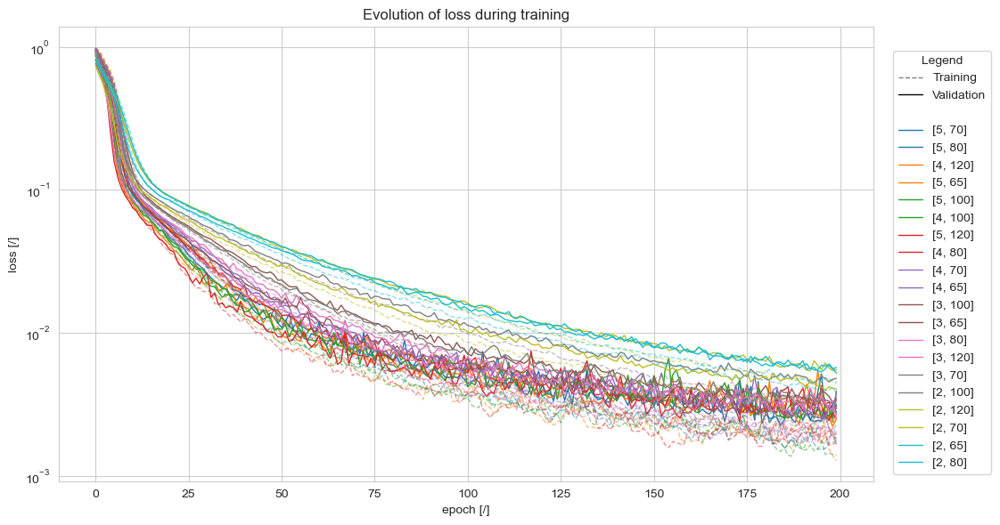

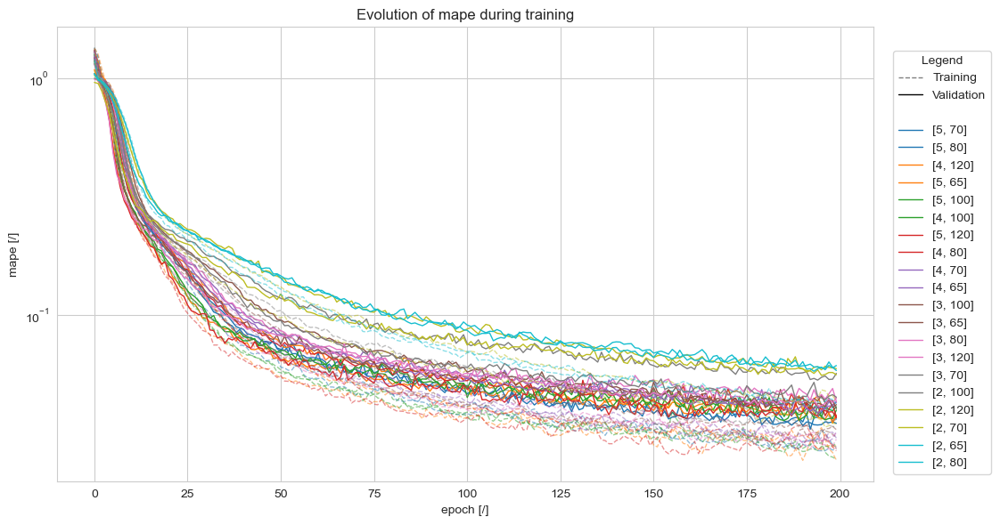

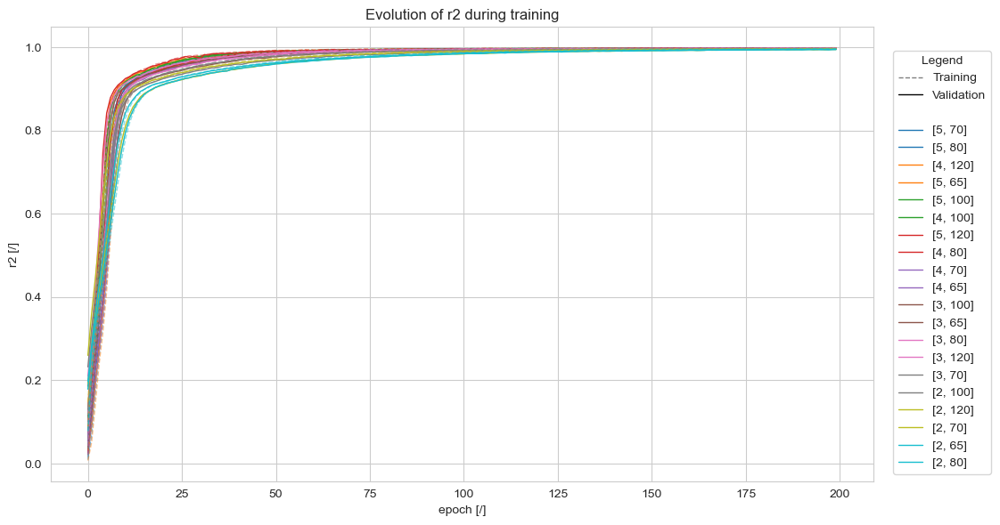

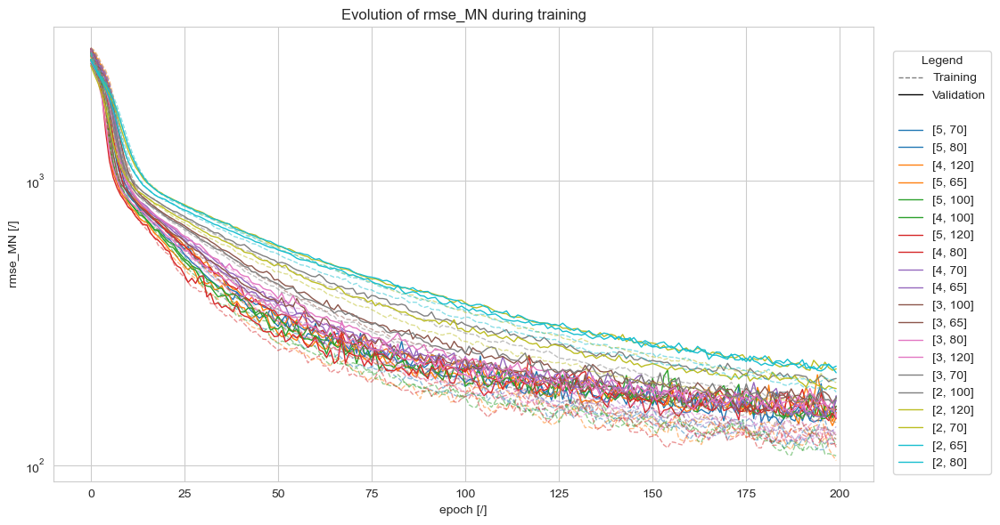

In [8]:
# Your existing code for preparing the data
_configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = _configs
configs = sorted(configs)
configs = [x[1] for x in configs]

best_hidden_dims = [int(configs[0][1]) for _ in range(int(configs[0][0]))]

labels = [str([int(x) for x in cfg]) for cfg in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

In [9]:
best_hidden_dims

[70, 70, 70, 70, 70]

### Activation function

In [15]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("activation_function")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 100
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

activation_values = ['relu', 'gelu', 'tanh', 'sigmoid',
                     'leaky_relu', 'leaky_relu', 'leaky_relu', 'leaky_relu']
activation_params_values = [None, None, None, None,
                            {'negative_slope': 5e-1}, {'negative_slope': 1e-1}, {'negative_slope': 5e-2},
                            {'negative_slope': 1e-2}]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for activation, activation_params in zip(activation_values, activation_params_values):
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': activation,
                                         'activation_params': activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, nn.MSELoss, kfold, log_step, {'loss': 'mse'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

2025/05/10 14:18:27 INFO mlflow.tracking.fluent: Experiment with name 'activation_function' does not exist. Creating a new experiment.


🏃 View run nervous-roo-143 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/f419c60bb3c44441ad279b4f179b1b1f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run inquisitive-fly-28 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/1891b3afca284969817781f4801edd91
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run crawling-mule-770 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/484a3fdd09fd491cba429d86a45a3407
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run likeable-colt-903 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/733425723b794da99e475db1239d8e08
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run beautiful-hog-962 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/74ce8f94889d4d1eae8dabc165b7da41
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/62736

In [16]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("activation_function")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

activations_combinations = set()
for m in runs_df['params.activation'].unique():
    for n in runs_df[runs_df['params.activation'] == m]['params.activation_params'].unique():
        activations_combinations.add((m, n))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in activations_combinations}
for k in activations_combinations:
    (act, params) = k
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse') &
        (runs_df['params.activation'] == act) &
        (runs_df['params.activation_params'] == params)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[k][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

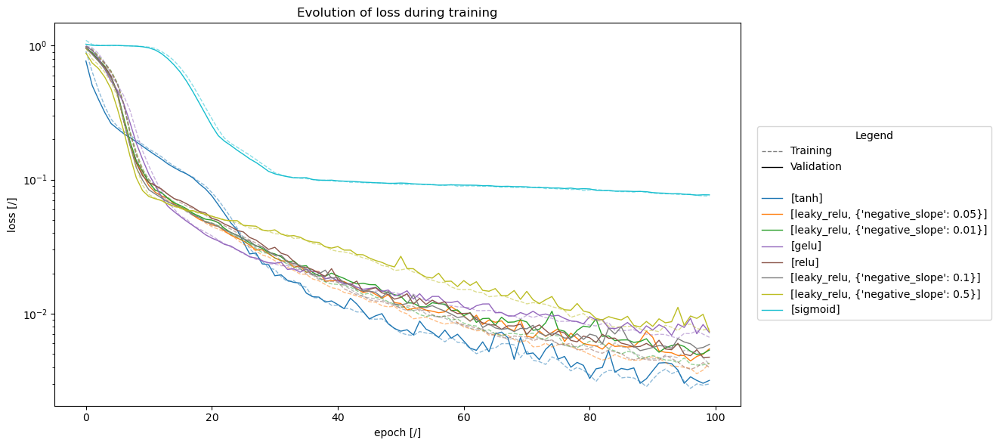

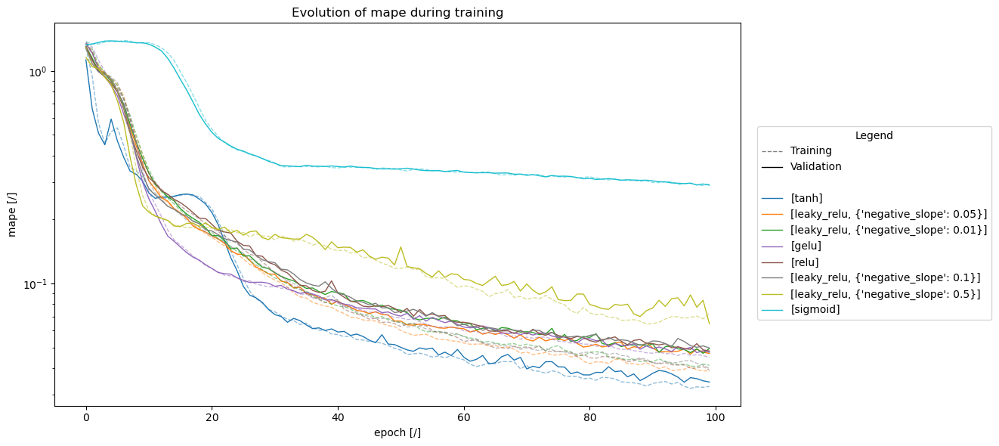

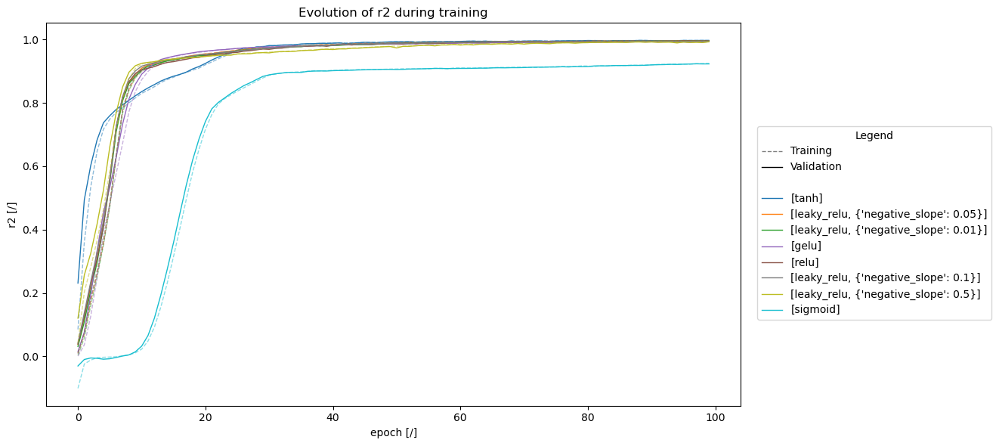

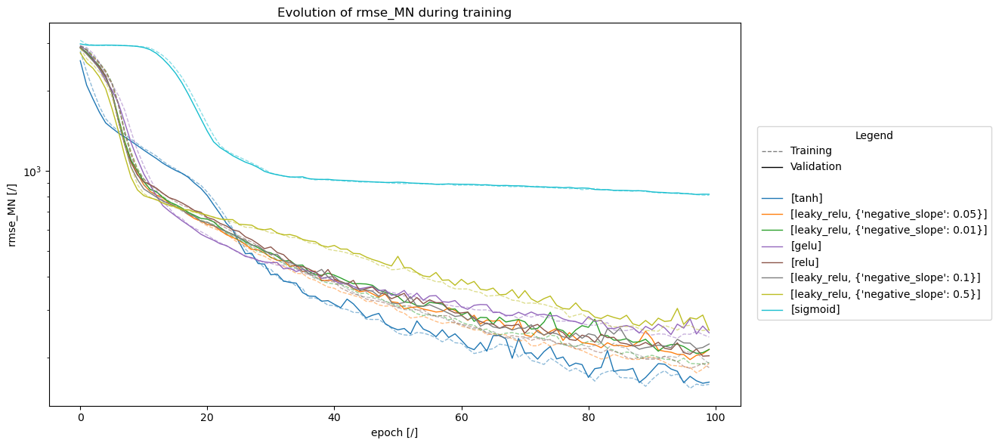

In [21]:
# Your existing code for preparing the data
configs = [x[1] for x in sorted([(np.min(v['val_mape']), k) for k, v in results.items()])]
labels = [f"[{cfg[0]}]" if cfg[1] == 'None' else f"[{cfg[0]}, {cfg[1]}]" for cfg in configs]

best_activation, best_activation_params = configs[0]
best_activation_params = ast.literal_eval(best_activation_params)

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

### Learning rate

In [22]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("learning_rate")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 100
lr_values = sorted(np.hstack([f * np.logspace(-4, -3, 2) for f in [1, 2.5, 5, 7.5]]))

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for LR in lr_values:
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': best_activation,
                                         'activation_params': best_activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, nn.MSELoss, kfold, log_step, {'loss': 'mse'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

2025/05/10 14:36:40 INFO mlflow.tracking.fluent: Experiment with name 'learning_rate' does not exist. Creating a new experiment.


🏃 View run placid-wasp-825 at: http://127.0.0.1:5000/#/experiments/361763975221534637/runs/d4ffe88691fd49668791832d6f0d7b04
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/361763975221534637
🏃 View run mercurial-gull-113 at: http://127.0.0.1:5000/#/experiments/361763975221534637/runs/de67adc2b8154f0daa42249a7f2a919e
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/361763975221534637
🏃 View run popular-foal-72 at: http://127.0.0.1:5000/#/experiments/361763975221534637/runs/bcb84df533ab4e3e931aacdfef366972
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/361763975221534637
🏃 View run polite-finch-947 at: http://127.0.0.1:5000/#/experiments/361763975221534637/runs/320968c0c8044ae3a3903d55c290600f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/361763975221534637
🏃 View run mercurial-grub-786 at: http://127.0.0.1:5000/#/experiments/361763975221534637/runs/bbd79f4dbb6840e3bc780bd4d0e655aa
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/3617639

In [23]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("learning_rate")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

learning_rates = set(runs_df['params.learning_rate'].unique())

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in learning_rates}
for lr in learning_rates:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse') &
        (runs_df['params.learning_rate'] == lr)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[lr][metric_name].append([metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

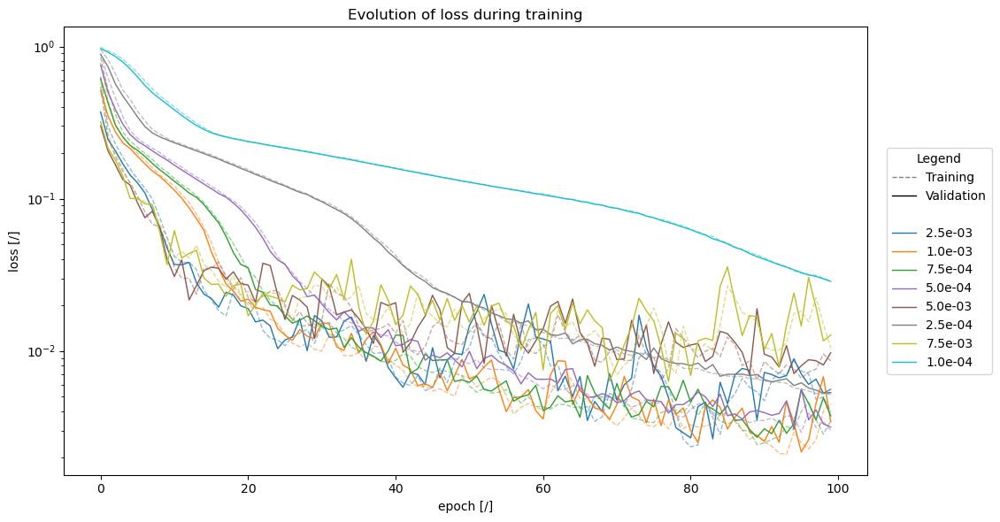

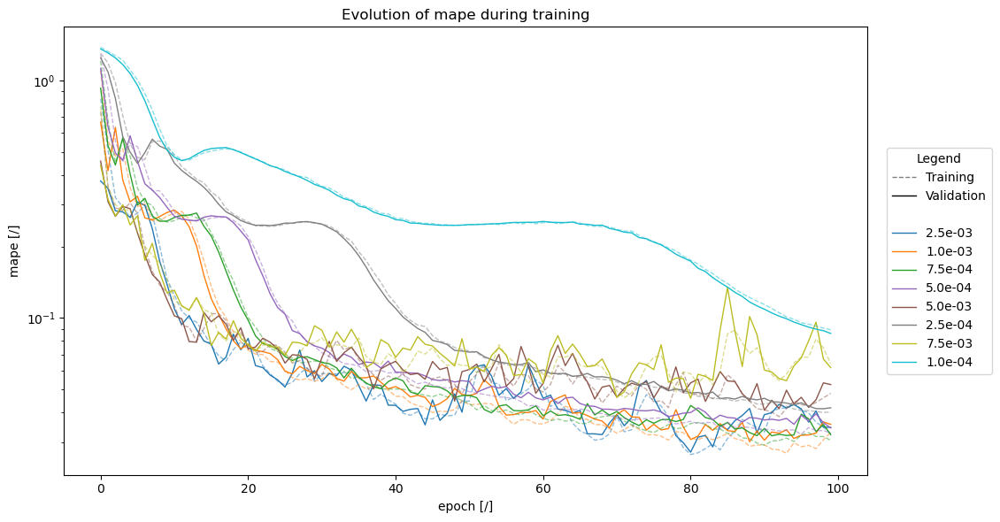

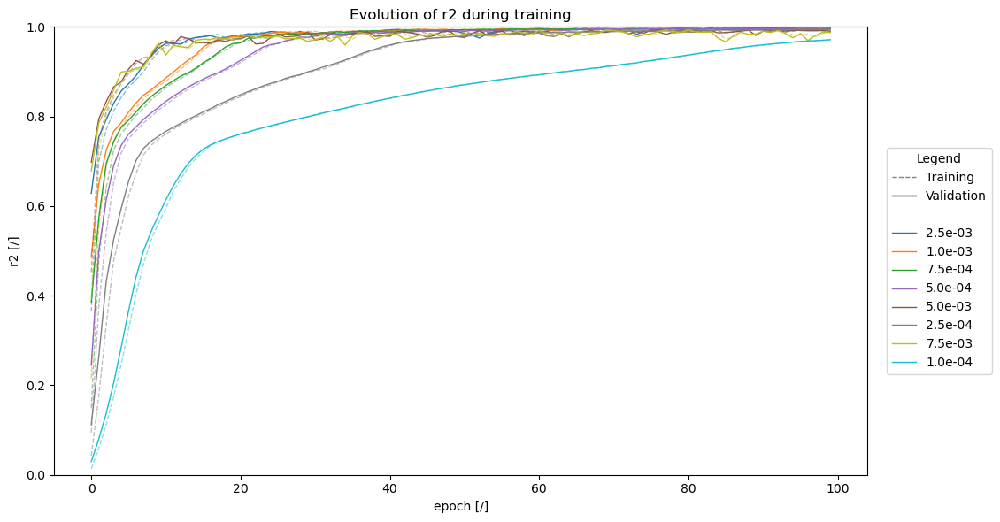

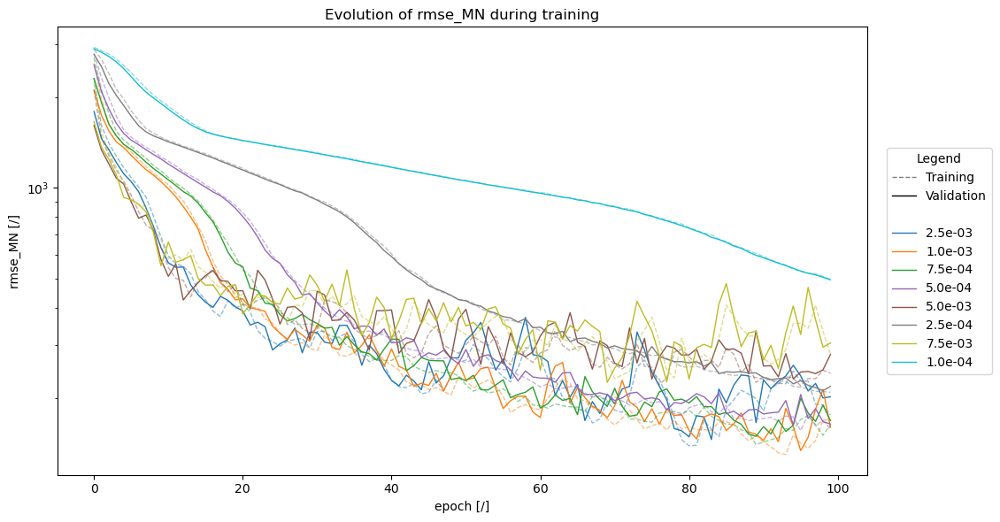

In [24]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{float(c):.1e}" for c in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(0, 1))
plot(results, configs, 'rmse_MN', labels)

In [151]:
best_lr = 2.5e-4

### Training

In [152]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("training")

VAL_BATCH_SIZE = 8192
N_EPOCH = 1_000
log_step = -1

sizes = [2 ** i for i in range(8, 15)]
batch_size_values = [512 for _ in sizes]  # [int(min(np.power(2, np.floor(np.log2(n)) - 1), 512)) for n in sizes]
dataset_path_values = [f"data/dataset/pratt_truss_bridge/single_ea/train_{n}.hdf5" for n in sizes]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for i, (dataset_path, TRAIN_BATCH_SIZE) in enumerate(zip(dataset_path_values, batch_size_values)):
        size = sizes[i]
        train_dataset = FixedPrattTrussDatasetSingleTarget(dataset_path)
        validation_dataset = _validation_ds
        future = executor.submit(trial_routine, None, train,
                                 {
                                     'input_dim': 65,
                                     'hidden_dims': best_hidden_dims,
                                     'output_dim': 1,
                                     'activation': best_activation,
                                     'activation_params': best_activation_params,
                                     'dropout': 0.0,
                                     'batch_norm': False,
                                     'layer_norm': False,
                                     'normalization_params': None,
                                     'output_activation': None,
                                     'output_activation_params': None
                                 },
                                 train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                 N_EPOCH,
                                 torch.optim.Adam, best_lr, nn.MSELoss,
                                 -1, log_step, {'loss': 'mse', 'noise': 0.})
        futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

2025/05/10 19:51:03 INFO mlflow.tracking.fluent: Experiment with name 'training' does not exist. Creating a new experiment.


🏃 View run gaudy-ray-259 at: http://127.0.0.1:5000/#/experiments/942350632732246975/runs/37940cc0579d4e14bb7db9ce156999b4
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/942350632732246975
🏃 View run overjoyed-boar-772 at: http://127.0.0.1:5000/#/experiments/942350632732246975/runs/14ef55f8f9ce4880b04b0652366f6423
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/942350632732246975
🏃 View run receptive-snail-744 at: http://127.0.0.1:5000/#/experiments/942350632732246975/runs/0be3e85303394598a05b84c60108c0ea
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/942350632732246975
🏃 View run rare-doe-963 at: http://127.0.0.1:5000/#/experiments/942350632732246975/runs/8be6df8082224fe0981300260719b838
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/942350632732246975
🏃 View run melodic-cub-501 at: http://127.0.0.1:5000/#/experiments/942350632732246975/runs/ccbde06c58724982bf151597a84d783c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/942350632732

In [154]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

sizes = set()
for size in runs_df['params.train_size'].unique():
    sizes.add(size)

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in sizes}
for size in sizes:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse') &
        (runs_df['params.train_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[size][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

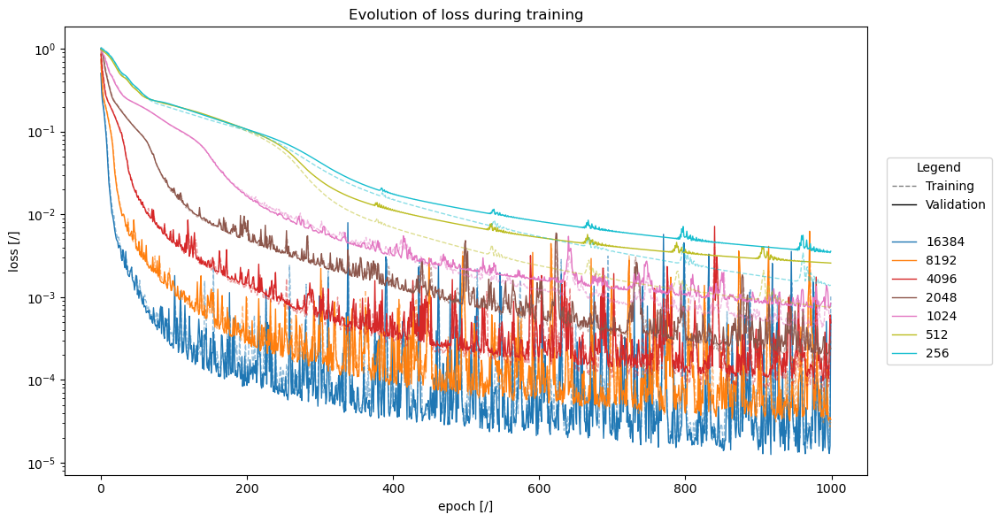

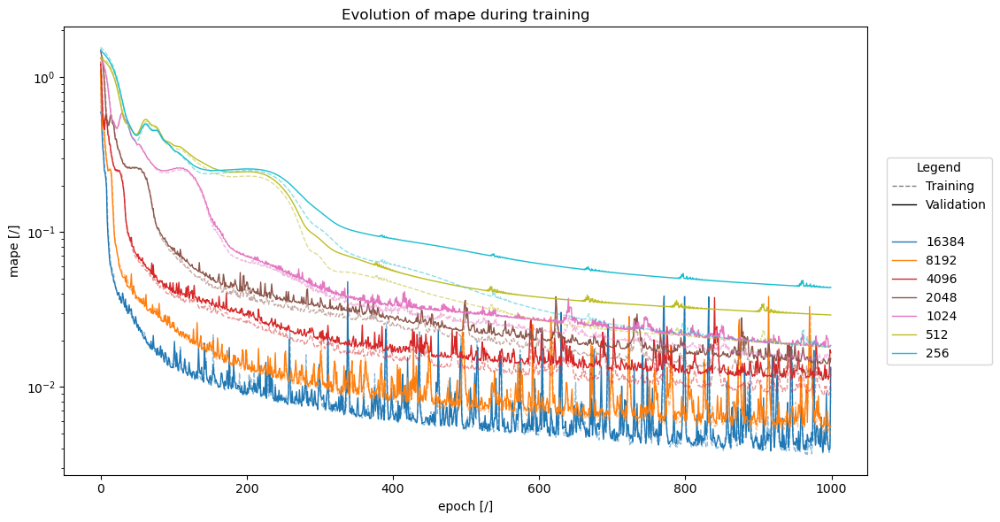

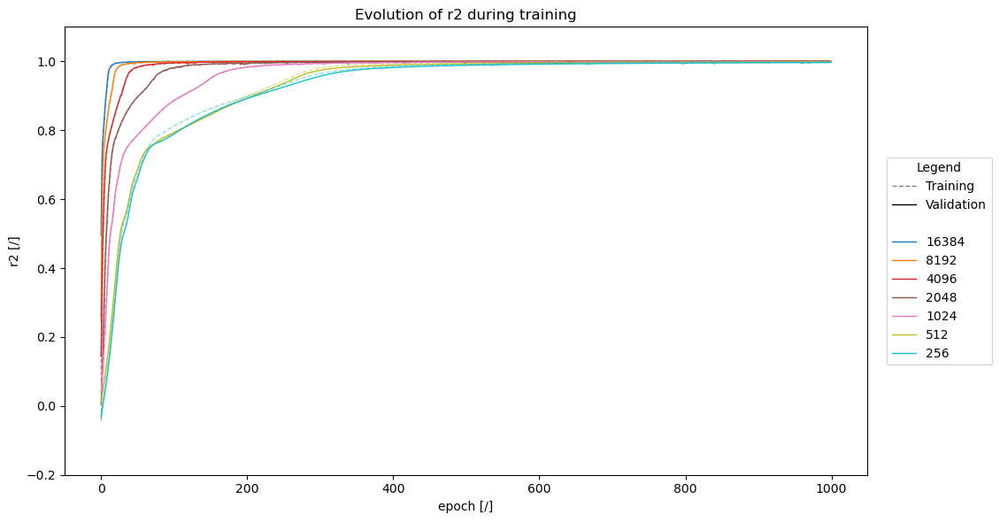

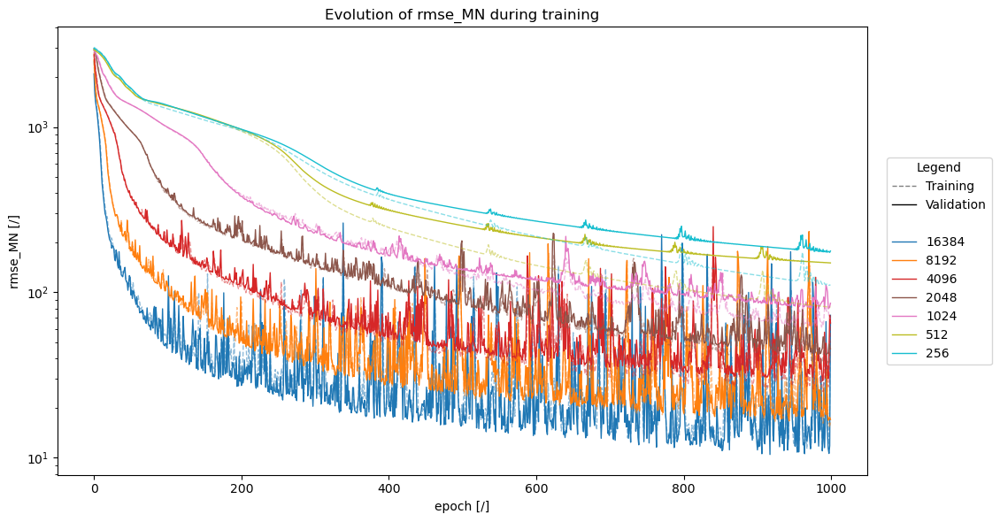

In [155]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{int(size)}" for size in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(-.2, 1.1))
plot(results, configs, 'rmse_MN', labels)

### Noise sensitivity

In [156]:
%%capture
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss'] == 'mse']

results = []

for f in np.linspace(0, .1, 6):
    validation_ds = FixedPrattTrussDatasetSingleTarget(
        "data/dataset/pratt_truss_bridge/test/single_8192.hdf5",
        f_noise_length=None,
        f_noise_loads=lambda size: 1. + np.random.exponential(f / 2, size=size) * (
                (np.random.binomial(1, .5, size=size) * 2.) - 1),
        f_noise_strain=lambda size: 1. + np.random.exponential(f / 2, size=size) * (
                (np.random.binomial(1, .5, size=size) * 2.) - 1),
        f_noise_displacement=lambda size: 1. + np.random.exponential(f / 2, size=size) * (
                (np.random.binomial(1, .5, size=size) * 2.) - 1),
    )

    dl = DataLoader(validation_ds, batch_size=8192)

    for i in range(len(runs_df[['artifact_uri', 'params.train_size']])):
        artifact_uri = runs_df.iloc[i]['artifact_uri']
        size = runs_df.iloc[i]['params.train_size']

        uri = f"{artifact_uri}/input_scaler/"
        input_scaler = load_model(uri)

        uri = f"{artifact_uri}/target_scaler/"
        target_scaler = load_model(uri)

        uri = f"{artifact_uri}/mape_model/"
        model = load_model(uri)

        for batch in dl:
            metrics = validation(model, batch, input_scaler, target_scaler, F.mse_loss)
        results.append((size, f, metrics))

In [157]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("noise_sensitivity")

df = pd.DataFrame([[results[i][0], results[i][1],
                    results[i][2]['r2'].item(),
                    results[i][2]['mape'].item(),
                    results[i][2]['rmse_MN'].item(),
                    results[i][2]['loss']]
                   for i in range(len(results))], columns=['train_size', 'noise', 'r2', 'mape', 'rmse_MN', 'loss'])
df.sort_values(by=['train_size', 'noise'], axis=0, ignore_index=True, inplace=True)

for size in df.train_size.unique():
    with mlflow.start_run():
        df_2 = df[df['train_size'] == size]
        # Model information logging
        mlflow.log_params({
            'train_size': size,
            'loss': 'mse',
            'test_set': 'single_ea'
        })
        for i in range(len(df_2)):
            mlflow.log_metrics(
                dict(df_2.iloc[i][1:]),
                step=i
            )

2025/05/10 20:37:16 INFO mlflow.tracking.fluent: Experiment with name 'noise_sensitivity' does not exist. Creating a new experiment.


🏃 View run overjoyed-steed-398 at: http://127.0.0.1:5000/#/experiments/238767268806225998/runs/a3fd4e744f05447a999a56bb0f86d149
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/238767268806225998
🏃 View run casual-penguin-130 at: http://127.0.0.1:5000/#/experiments/238767268806225998/runs/c97b01e23aad4923a906953882215872
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/238767268806225998
🏃 View run youthful-yak-89 at: http://127.0.0.1:5000/#/experiments/238767268806225998/runs/9cc08c8eea4349c29d1fdeb7a733eed3
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/238767268806225998
🏃 View run treasured-bird-670 at: http://127.0.0.1:5000/#/experiments/238767268806225998/runs/fbbf2baaf22b46f5a19766316f4de402
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/238767268806225998
🏃 View run thoughtful-crab-747 at: http://127.0.0.1:5000/#/experiments/238767268806225998/runs/4618924937aa47d2be20570792019242
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/

# PINN Only

In [4]:
ds = FixedPrattTrussDatasetSingleTarget("data/dataset/pratt_truss_bridge/single_ea/train_128.hdf5")
k_s = (int(ds.stiffness_matrix[0].__len__() ** .5),) * 2
k_ref = ds.stiffness_matrix[0].reshape(k_s).astype(np.float64)
k_ref /= ds[0][1]
k_ref[[0, 1, 17], [0, 1, 17]] = 1
#k_ref[k_ref.abs() < 1e-9] = 0
k_ref = k_ref.to(torch.float32).to(device)

In [5]:
def u_from_x(x, n_panels=8):
    batch_size = len(x)
    u = torch.zeros((batch_size, 4 * n_panels), device=x.device)
    u[:, 2:2 * n_panels + 1] = x[:, :2 * (n_panels - 1) + 1]
    u[:, 2 * (n_panels + 1):] = x[:, 2 * (n_panels - 1) + 1:4 * n_panels - 3]
    return u.unsqueeze(-1)


def q_from_x_q(x, q, n_panels=8):
    q = q.squeeze(-1)
    q[:, np.arange(3, 2 * n_panels, 2)] = x[:, 4 * n_panels - 3: 5 * n_panels - 4]

    return q.unsqueeze(-1)


def train_step(model, batch, input_scaler, target_scaler, optimizer, criterion):
    model.train()

    input, target, _, u, q = batch
    input, target = input.to(device), target.to(device)
    u, q = u.to(device), q.to(device)
    q[:, [0, 1, 17], :] = 0.

    z_input = input_scaler.transform(input)
    z_target = target_scaler.transform(target)

    z_target_pred = model(z_input)
    target_pred = target_scaler.inverse_transform(z_target_pred)

    k_pred = k_ref * target_pred.unsqueeze(-1)
    k_pred[:, [0, 1, 17], [0, 1, 17]] = 1.

    optimizer.zero_grad()
    loss = criterion(k_pred * 1e-6,
                     u_from_x(input, 8) * 1e3,
                     q_from_x_q(input, q, 8) * 1e-3)
    loss.backward()
    optimizer.step()

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss'] = loss.item()

    return metrics


def validation(model, batch, input_scaler, target_scaler, criterion):
    model.eval()
    with torch.no_grad():
        input, target, _, u, q = batch
        input, target = input.to(device), target.to(device)
        u, q = u.to(device), q.to(device)
        q[:, [0, 1, 17], :] = 0.

        z_input = input_scaler.transform(input)
        z_target = target_scaler.transform(target)

        z_target_pred = model(z_input)
        target_pred = target_scaler.inverse_transform(z_target_pred)

        k_pred = k_ref * target_pred.unsqueeze(-1)
        k_pred[:, [0, 1, 17], [0, 1, 17]] = 1.

        loss = criterion(k_pred * 1e-6,
                         u_from_x(input, 8) * 1e3,
                         q_from_x_q(input, q, 8) * 1e-3)

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss'] = loss.item()

    return metrics


def compute_metrics(model, target_pred, z_target_pred, target, z_target):
    model.eval()

    with torch.no_grad():
        r2 = R.r2_score(z_target_pred, z_target)
        if r2.isinf():  # Switch to 64 bits in case of overflow
            r2 = R.r2_score(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64))
        mape = R.mean_absolute_percentage_error(target_pred, target)
        rmse = R.mean_squared_error(target_pred * 1e-6, target * 1e-6, squared=False)
        if rmse.isinf():  # Switch to 64 bits in case of overflow
            rmse = R.mean_squared_error(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64),
                                        squared=False)

    return {'r2': r2, 'mape': mape, 'rmse_MN': rmse}


def log_epoch(train_metrics, val_metrics, epoch):
    metrics = dict()
    metrics.update({f'train_{k}': v for k, v in train_metrics.items()})
    metrics.update({f'val_{k}': v for k, v in val_metrics.items()})

    mlflow.log_metrics(metrics, step=epoch + 1)


def log_model(name, model, signature, metadata=None):
    mlflow.pytorch.log_model(
        pytorch_model=model,
        artifact_path=name,
        signature=signature,
        metadata=metadata
    )


def console_log(epoch, train_metrics, val_metrics):
    print(f">> Epoch {epoch + 1:4d}", end='  ')
    print(f"TRAIN", end='   ')
    metric_names = {k for k in train_metrics.keys() if k != 'loss'}
    metric_names = ['loss'] + sorted(metric_names)
    for k in metric_names:
        v = train_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')

    print("  ||  ", end='')
    print(f"VALIDATION", end='   ')
    metric_names = {k for k in val_metrics.keys() if k != 'loss'}
    metric_names = ['loss'] + sorted(metric_names)
    for k in metric_names:
        v = val_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')
    print()


def train(model, train_dataset, val_dataset, train_batch_size, val_batch_size, n_epoch, optimizer, criterion,
          log_step=10):
    model = model.to(device)
    criterion = criterion.to(device)
    train_dl = DataLoader(train_dataset, train_batch_size, shuffle=True)
    val_dl = DataLoader(val_dataset, val_batch_size, shuffle=False)

    input_scaler = StandardScaler(train_dataset[0][0].__len__()).to(device)
    target_scaler = StandardScaler(train_dataset[0][1].__len__()).to(device)

    # Train the scaler
    input, target = None, None
    for batch in train_dl:
        input, target, _, _, _ = batch
        input, target = input.to(device), target.to(device)
        input_scaler.partial_fit(input)
        target_scaler.partial_fit(target)

    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(),
                                              input_scaler.transform(input).cpu().detach().numpy())
    log_model('input_scaler', input_scaler, signature=signature)

    signature = mlflow.models.infer_signature(target.cpu().detach().numpy(),
                                              target_scaler.transform(target).cpu().detach().numpy())
    log_model('target_scaler', target_scaler, signature=signature)

    best_val_metric = {
        'mape': {model: None, 'value': np.inf, 'epoch': -1},
        'rmse_MN': {model: None, 'value': np.inf, 'epoch': -1},
        'loss': {model: None, 'value': np.inf, 'epoch': -1},
        'r2': {model: None, 'value': -np.inf, 'epoch': -1}
    }

    for epoch in range(n_epoch):
        train_metrics = {}
        val_metrics = {}
        for batch in train_dl:
            train_metrics_epoch = train_step(model, batch, input_scaler, target_scaler, optimizer, criterion)
            for k, m in train_metrics_epoch.items():
                if k not in train_metrics: train_metrics[k] = []
                train_metrics[k].append(m)

        for batch in val_dl:
            val_metrics_epoch = validation(model, batch, input_scaler, target_scaler, criterion)
            for k, m in val_metrics_epoch.items():
                if k not in val_metrics: val_metrics[k] = []
                val_metrics[k].append(m)

        # Compute the mean on GPU  -> Faster for batch
        train_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                         train_metrics.items()}
        val_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                       val_metrics.items()}

        log_epoch(train_metrics, val_metrics, epoch)

        negative_metrics = {'r2'}  # Set of metrics which are better when higher

        for k, v in val_metrics.items():
            f = 1 if k not in negative_metrics else -1
            if f * best_val_metric[k]['value'] >= f * v:
                best_val_metric[k] = {'model': deepcopy(model), 'value': v.item(), 'epoch': epoch + 1}

        if (log_step < 0): continue
        if (epoch % log_step == 0):
            console_log(epoch, train_metrics, val_metrics)

    input, target, _, _, _ = train_dl.__iter__().__next__()
    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(), target.cpu().detach().numpy())
    for k, v in best_val_metric.items():
        metric = v['value']
        epoch = v['epoch']
        log_model(f"{k}_model", v['model'], signature=signature, metadata={'metric': metric, 'epoch': epoch + 1})


def trial_routine(run_name, train_routine, mlp_params, train_dataset, val_dataset, train_batch_size,
                  val_batch_size, n_epoch, optimizer, lr, criterion, fold, log_step=10, log_params=None):
    with mlflow.start_run(run_name=run_name):
        # Model initialization
        model = MLP(**mlp_params)

        # Model information logging
        capacity = sum(np.prod(p.size()) for p in filter(lambda p: p.requires_grad, model.parameters()))
        if log_params is not None:
            mlflow.log_params(log_params)
        mlflow.log_params(mlp_params)
        mlflow.log_params({
            'n_hidden_layers': len(mlp_params['hidden_dims']),
            'hidden_layers_size': mlp_params['hidden_dims'][0],
            'capacity': capacity,
            'n_epoch': n_epoch,
            'val_batch_size': val_batch_size,
            'train_batch_size': train_batch_size,
            'train_size': train_dataset.__len__(),
            'val_size': val_dataset.__len__(),
            'k-fold': fold,
            'optimizer': optimizer.__name__,
            'learning_rate': f"{lr:.1e}",
            'criterion': criterion.__name__,
        })

        # Run the training with the configuration
        train_routine(model, train_dataset, val_dataset,
                      train_batch_size, val_batch_size,
                      n_epoch, optimizer(model.parameters(), lr=lr), criterion(), log_step=log_step)

In [6]:
def plot(results, configs, metric, labels, log=True, xlim=None, ylim=None):
    cmap = mpl.colormaps['tab10']
    c = cmap(np.linspace(0, 1, len(configs)))

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the data but collect the handles for the legend
    config_handles = []
    for i, conf in enumerate(configs):
        # Store only the validation line handles for the legend
        l = len(results[conf][f'train_{metric}'])
        h = ax.plot(np.arange(l), results[conf][f'train_{metric}'], alpha=.5, ls='--', lw=1, c=c[i])[0]
        h2 = ax.plot(np.arange(l), results[conf][f'val_{metric}'], ls='-', lw=1, c=c[i])[0]
        config_handles.append(h2)

    # Create custom handles for the line style legend
    line_style_handles = [
        Line2D([0], [0], color='black', lw=1, ls='--', alpha=0.5, label='Training'),
        Line2D([0], [0], color='black', lw=1, ls='-', label='Validation'),
        Line2D([0], [0], color='black', alpha=0, lw=1, ls='-')
    ]

    # Get the current position and size of the axis
    box = ax.get_position()
    # Reduce the width of the axis to make room for the legend
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Combine both sets of handles and labels
    all_handles = line_style_handles + config_handles
    all_labels = ['Training', 'Validation', ''] + labels

    # Create a single legend with both line styles and configurations
    plt.figlegend(all_handles, all_labels, loc='center left', bbox_to_anchor=(1, .5),
                  title="Legend")

    ax.set_title(f"Evolution of {metric} during training")
    if log:
        ax.set_yscale('log')
    ax.set_ylabel(f"{metric} [/]")
    ax.set_xlabel("epoch [/]")

    if xlim: ax.set_xlim(*xlim)
    if ylim: ax.set_ylim(*ylim)

    plt.tight_layout()
    # Adjust right padding to make room for the legend
    plt.show()

## Hyperparameter tuning

### Model capacity

In [161]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("model_capacity")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 200
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

n_layers_values = [2, 3, 4, 5]
n_neurons_values = [65, 70, 80, 80, 100, 120]
with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for n_layers in n_layers_values:
        for n_neurons in n_neurons_values:
            for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
                hidden_dims = [n_neurons for _ in range(n_layers)]
                train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
                future = executor.submit(trial_routine, None, train,
                                         {
                                             'input_dim': 65,
                                             'hidden_dims': hidden_dims,
                                             'output_dim': 1,
                                             'activation': "relu",
                                             'activation_params': None,
                                             'dropout': 0.0,
                                             'batch_norm': False,
                                             'layer_norm': False,
                                             'normalization_params': None,
                                             'output_activation': None,
                                             'output_activation_params': None,
                                         },
                                         train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                         N_EPOCH,
                                         torch.optim.Adam, LR, StiffnessToLoadLoss, kfold, log_step, {'loss': 'pinn'})
                futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run overjoyed-finch-90 at: http://127.0.0.1:5000/#/experiments/210863443071476398/runs/56eef0e8872d4092a117953b182bcff5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/210863443071476398
🏃 View run omniscient-rat-489 at: http://127.0.0.1:5000/#/experiments/210863443071476398/runs/ee99e2b5664f44ee8a84d92d360cd2d5
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/210863443071476398
🏃 View run welcoming-owl-75 at: http://127.0.0.1:5000/#/experiments/210863443071476398/runs/2eb8c0e694284785b388a422407c937a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/210863443071476398
🏃 View run salty-squirrel-511 at: http://127.0.0.1:5000/#/experiments/210863443071476398/runs/fcbfb2b645c24f5a9b506f30f20496cd
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/210863443071476398
🏃 View run righteous-doe-668 at: http://127.0.0.1:5000/#/experiments/210863443071476398/runs/2b64c4e1eab746ad981a55b2c0a7c17f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/21

In [7]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("model_capacity")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

layers_combinations = set()
for n_layers in runs_df['params.n_hidden_layers'].unique():
    for layer_size in runs_df['params.hidden_layers_size'].unique():
        layers_combinations.add((n_layers, layer_size))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in layers_combinations}
for n, size in layers_combinations:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'pinn') &
        (runs_df['params.n_hidden_layers'] == n) &
        (runs_df['params.hidden_layers_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[(n, size)][metric_name].append(
                [metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

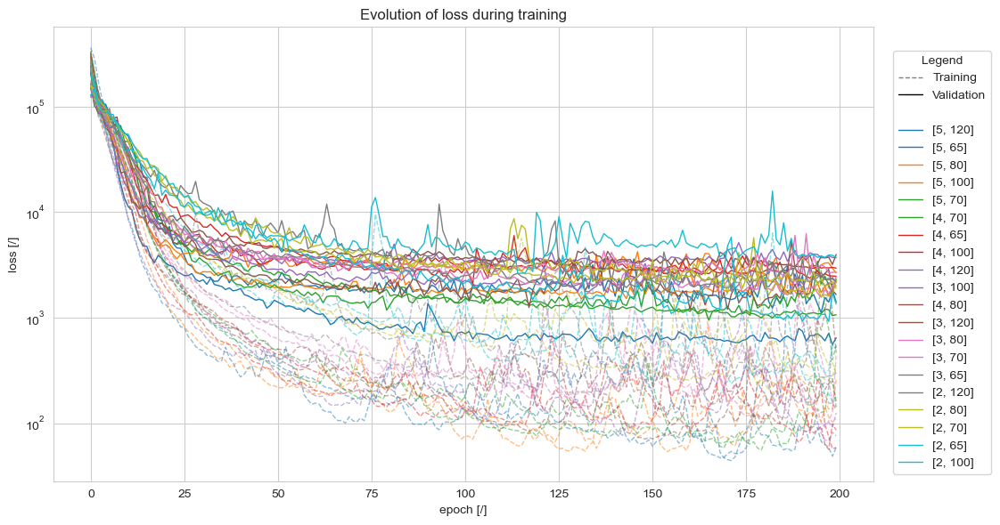

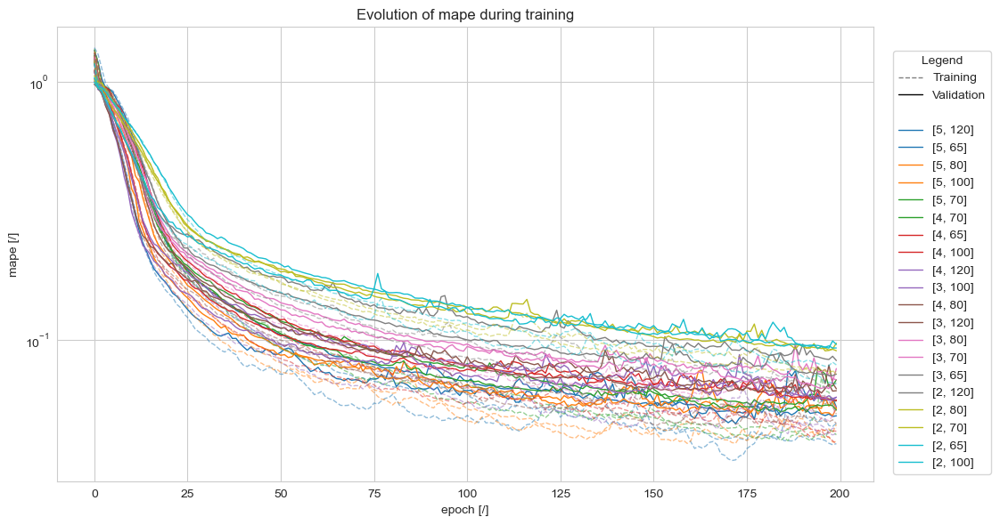

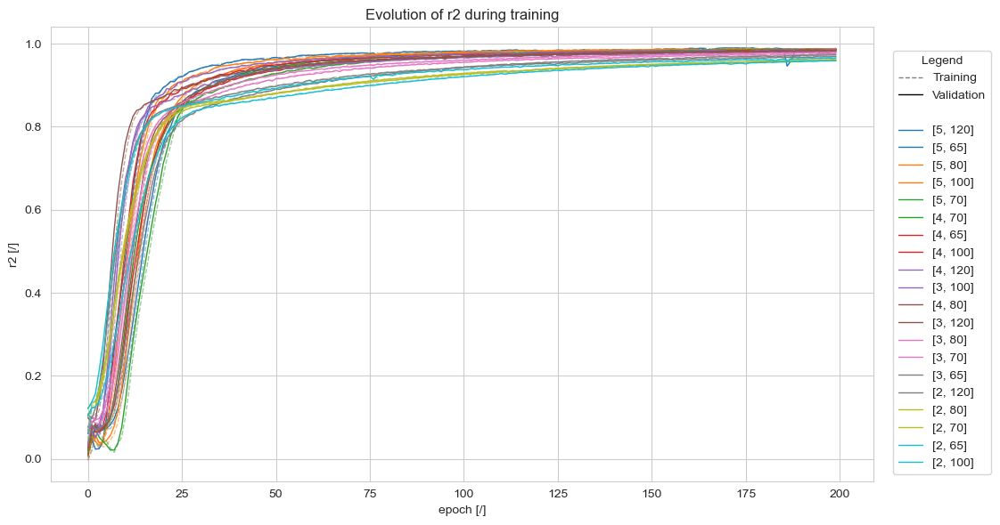

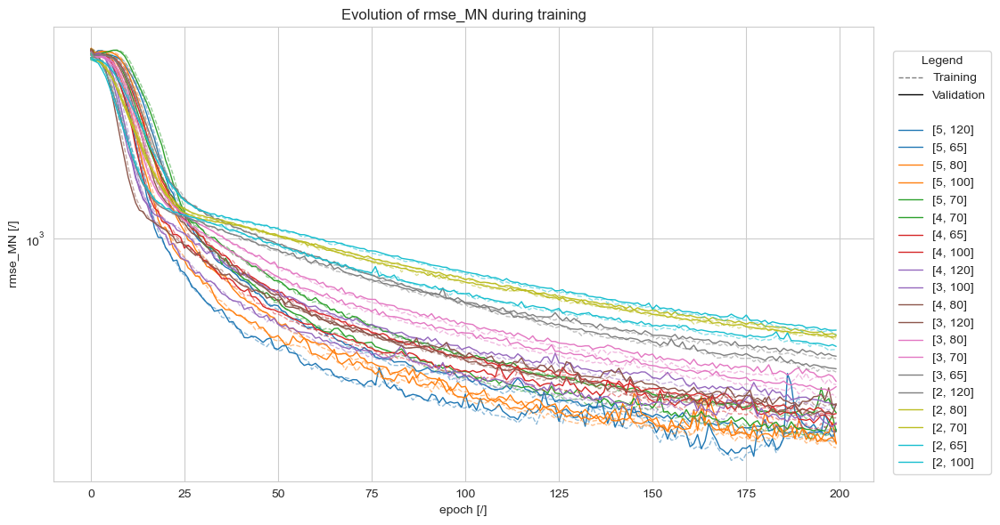

In [8]:
# Your existing code for preparing the data
_configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = _configs
configs = sorted(configs)
configs = [x[1] for x in configs]

labels = [str([int(x) for x in cfg]) for cfg in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

In [9]:
best_hidden_dims = [65 for _ in range(5)]

### Activation function

In [167]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("activation_function")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 200
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

activation_values = ['relu', 'gelu', 'tanh', 'sigmoid',
                     'leaky_relu', 'leaky_relu', 'leaky_relu', 'leaky_relu']
activation_params_values = [None, None, None, None,
                            {'negative_slope': 5e-1}, {'negative_slope': 1e-1}, {'negative_slope': 5e-2},
                            {'negative_slope': 1e-2}]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for activation, activation_params in zip(activation_values, activation_params_values):
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': activation,
                                         'activation_params': activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, StiffnessToLoadLoss, kfold, log_step, {'loss': 'pinn'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run burly-gnu-855 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/fd29f8879cfe46c68994177fd68b36e7
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run nervous-shad-170 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/bbf4e366122846879041f5b4c399529c
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run sassy-gnu-455 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/730427c0765944f0bef9f927db8c5e6a
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run nimble-shrike-170 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/86fc08db736c4a7ebfb9386d9c2a8c1f
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/627366066998034609
🏃 View run crawling-sow-843 at: http://127.0.0.1:5000/#/experiments/627366066998034609/runs/e5175bb39b4e4bd8956e664c49939289
🧪 View experiment at: http://127.0.0.1:5000/#/experiments/62736606699803

In [178]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("activation_function")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

activations_combinations = set()
for m in runs_df['params.activation'].unique():
    for n in runs_df[runs_df['params.activation'] == m]['params.activation_params'].unique():
        activations_combinations.add((m, n))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in activations_combinations}
for k in activations_combinations:
    (act, params) = k
    run_ids = runs_df[
        (runs_df['params.loss'] == 'pinn') &
        (runs_df['params.activation'] == act) &
        (runs_df['params.activation_params'] == params)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[k][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

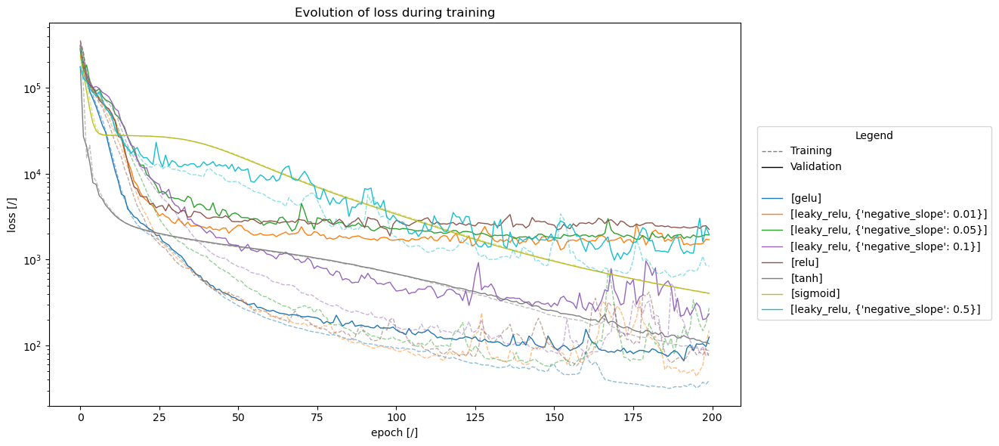

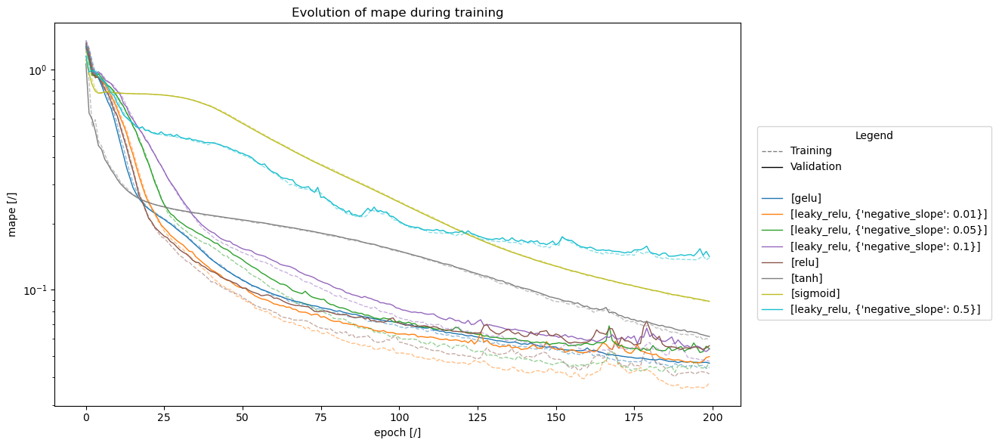

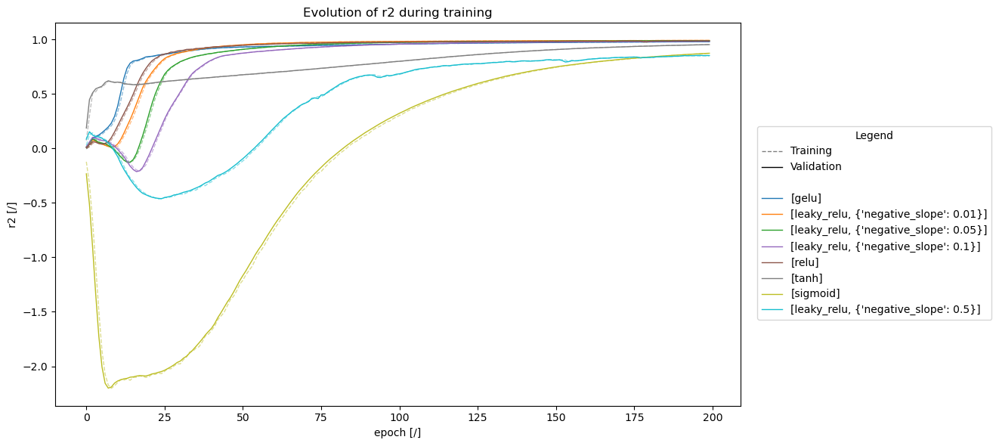

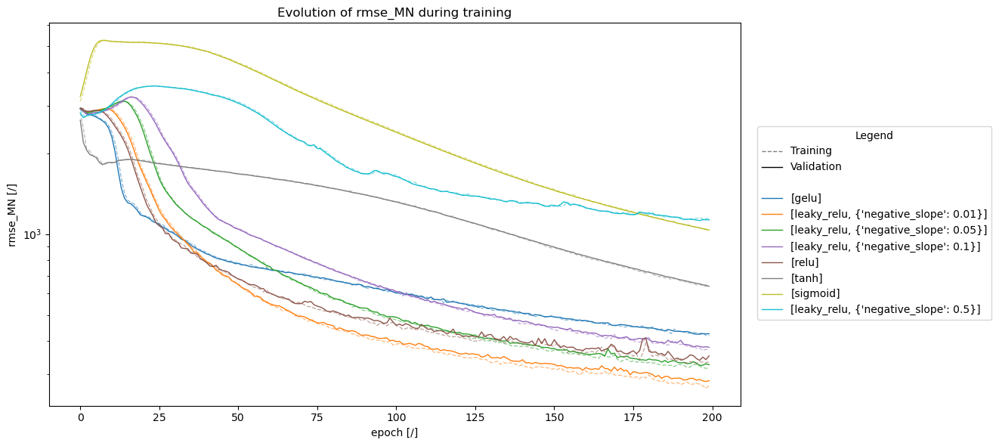

In [179]:
# Your existing code for preparing the data
configs = [x[1] for x in sorted([(np.min(v['val_mape']), k) for k, v in results.items()])]
labels = [f"[{cfg[0]}]" if cfg[1] == 'None' else f"[{cfg[0]}, {cfg[1]}]" for cfg in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

In [10]:
#best_activation, best_activation_params = configs[0]
#best_activation_params = ast.literal_eval(best_activation_params)

best_activation = 'leaky_relu'
best_activation_params = {'negative_slope': 0.01}

### Learning rate

In [183]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("learning_rate")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 100
lr_values = sorted(np.hstack([f * np.logspace(-4, -3, 2) for f in [1, 2.5, 5, 7.5]]))

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for LR in lr_values:
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': best_activation,
                                         'activation_params': best_activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, StiffnessToLoadLoss, kfold, log_step, {'loss': 'pinn'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run rumbling-newt-301 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/a29c1c4802d747ab871fdb4f232b0e62
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run blushing-sponge-738 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/8ab6370ad7774090a0b92f151ef791cb
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run enthused-elk-546 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/841b4727c163414dbe8def6bcec05183
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run bustling-donkey-988 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/9c922cccb2c84e73a0b16a4247650faf
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run industrious-doe-389 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/498af21aaa724868aba25e9aec0d6d33
🧪 View experiment at: http://127.0.0.1:5001/#/experiments

In [184]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("learning_rate")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

learning_rates = set(runs_df['params.learning_rate'].unique())

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in learning_rates}
for lr in learning_rates:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'pinn') &
        (runs_df['params.learning_rate'] == lr)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[lr][metric_name].append([metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

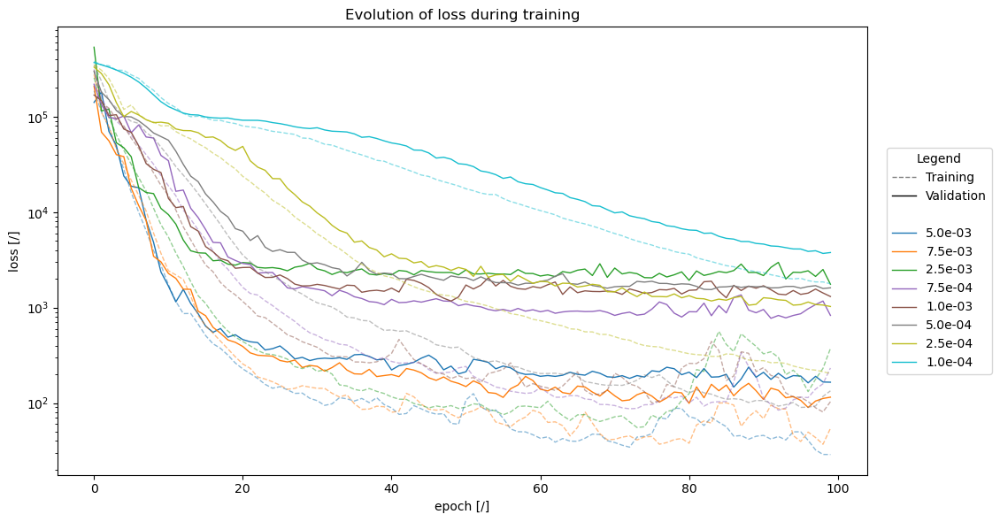

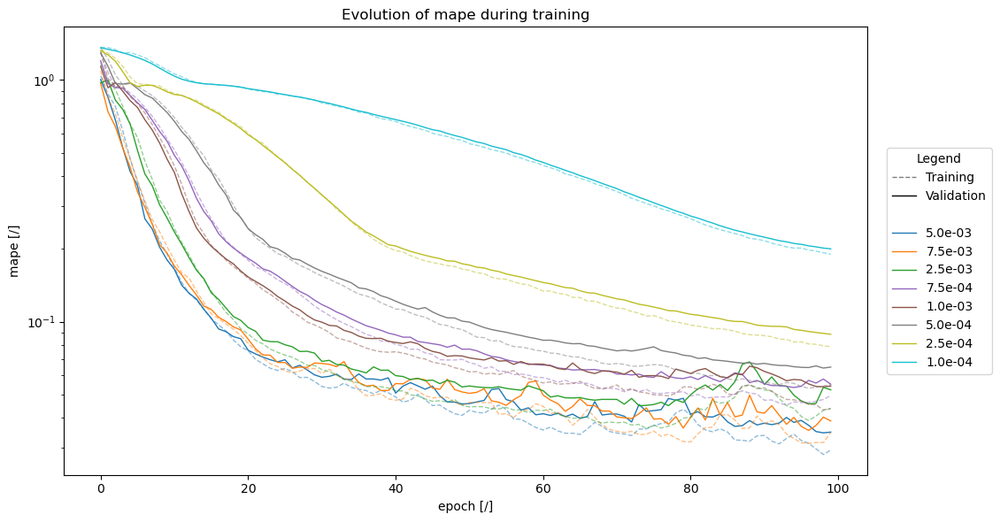

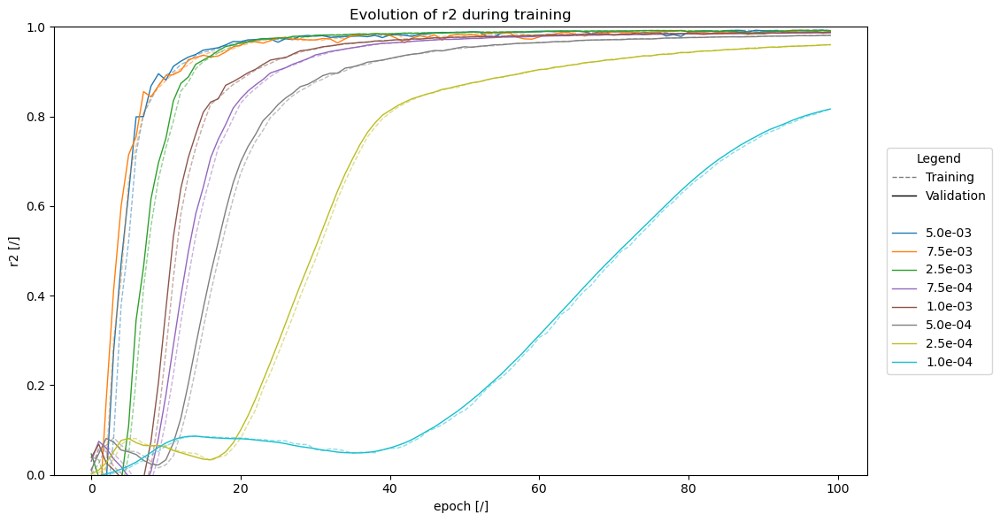

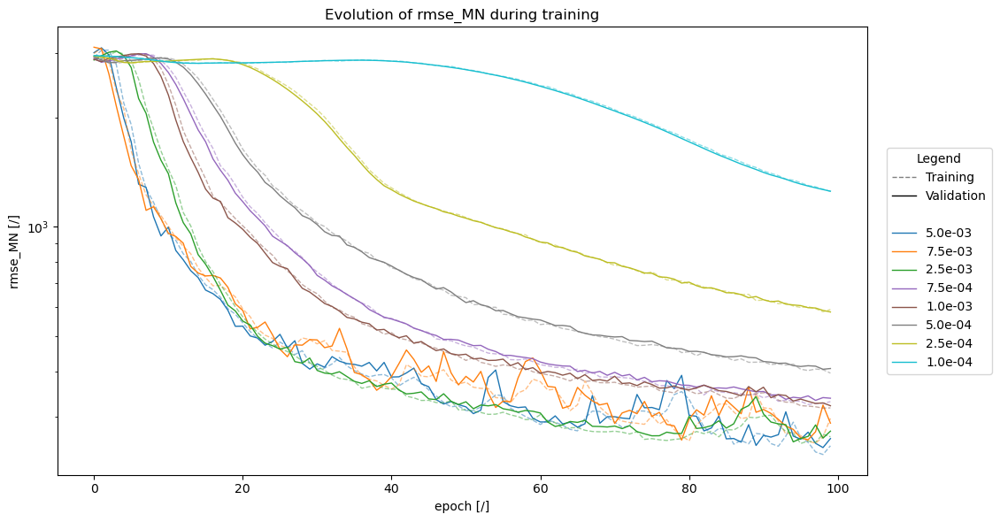

In [185]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{float(c):.1e}" for c in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(0, 1))
plot(results, configs, 'rmse_MN', labels)

In [186]:
best_lr = 7.5e-4

### Training

In [187]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("training")

VAL_BATCH_SIZE = 8192
N_EPOCH = 1_000
log_step = -1

sizes = [2 ** i for i in range(8, 15)]
batch_size_values = [512 for _ in sizes]  # [int(min(np.power(2, np.floor(np.log2(n)) - 1), 512)) for n in sizes]
dataset_path_values = [f"data/dataset/pratt_truss_bridge/single_ea/train_{n}.hdf5" for n in sizes]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for i, (dataset_path, TRAIN_BATCH_SIZE) in enumerate(zip(dataset_path_values, batch_size_values)):
        size = sizes[i]
        train_dataset = FixedPrattTrussDatasetSingleTarget(dataset_path)
        validation_dataset = _validation_ds
        future = executor.submit(trial_routine, None, train,
                                 {
                                     'input_dim': 65,
                                     'hidden_dims': best_hidden_dims,
                                     'output_dim': 1,
                                     'activation': best_activation,
                                     'activation_params': best_activation_params,
                                     'dropout': 0.0,
                                     'batch_norm': False,
                                     'layer_norm': False,
                                     'normalization_params': None,
                                     'output_activation': None,
                                     'output_activation_params': None
                                 },
                                 train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                 N_EPOCH,
                                 torch.optim.Adam, best_lr, StiffnessToLoadLoss,
                                 -1, log_step, {'loss': 'pinn', 'noise': 0.})
        futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run crawling-hound-562 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/7937b33a12b94651a5f6540e5f143c12
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run zealous-turtle-76 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/1cdf7b55cc92470483f9806307b1bef8
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run inquisitive-gull-110 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/fec18be6e7ee4d558f4bdf1eaa9761e1
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run industrious-owl-442 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/3450999291454708b9ad238da937266c
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run useful-dolphin-663 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/7fac0cb76811478984690cf4f23c5b99
🧪 View experiment at: http://127.0.0.1:5001/#/experimen

In [188]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

sizes = set()
for size in runs_df['params.train_size'].unique():
    sizes.add(size)

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in sizes}
for size in sizes:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'pinn') &
        (runs_df['params.train_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[size][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

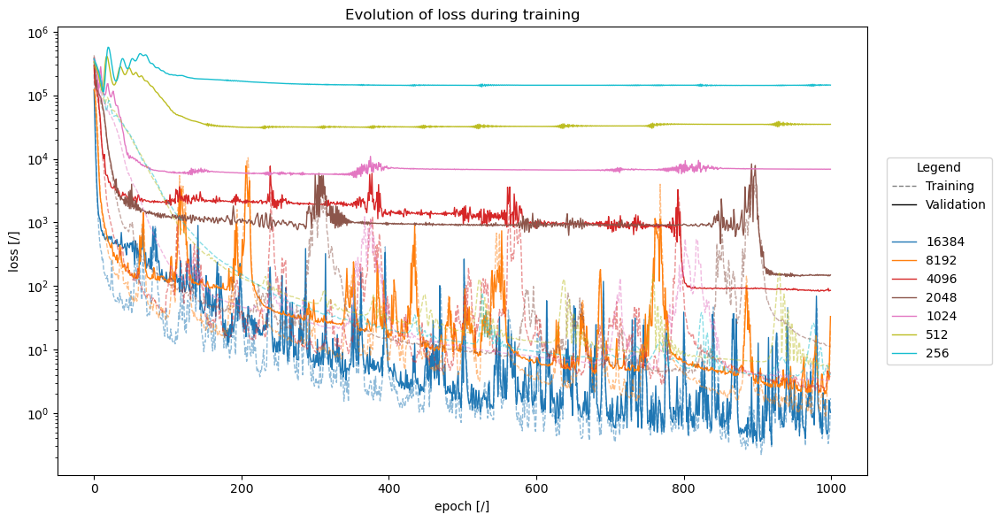

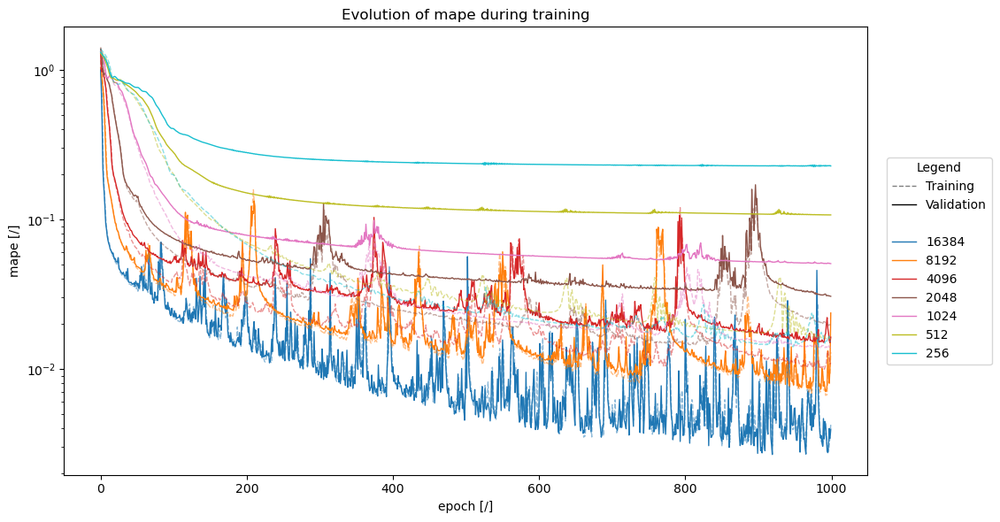

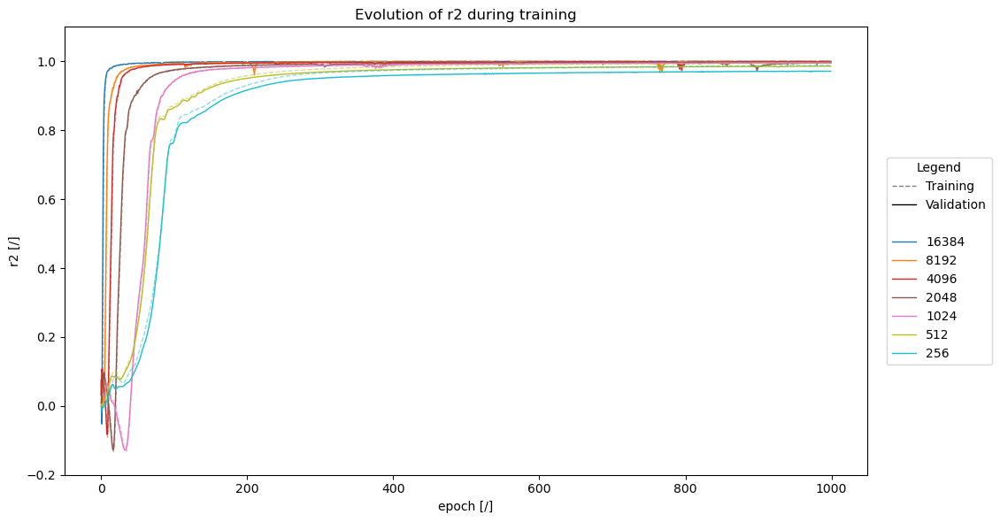

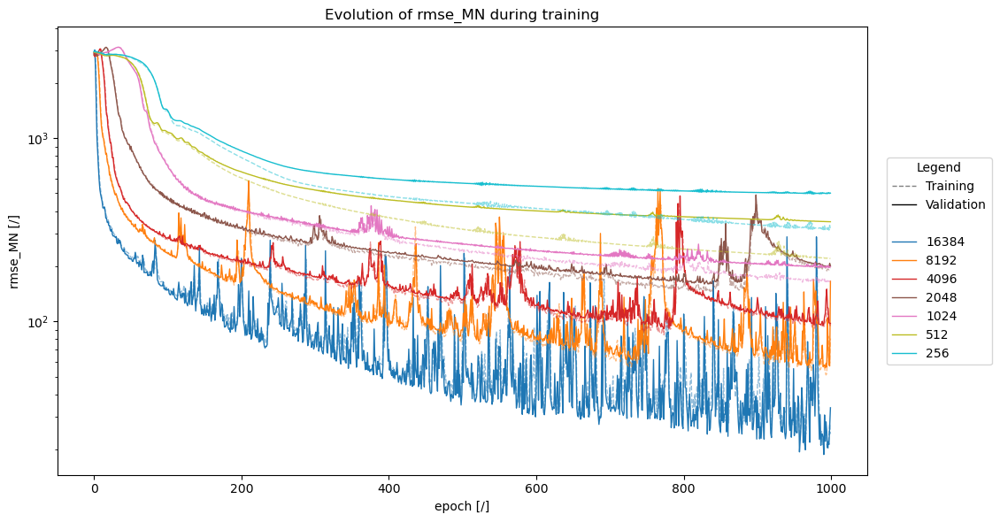

In [189]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{int(size)}" for size in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(-.2, 1.1))
plot(results, configs, 'rmse_MN', labels)

### Noise sensitivity

In [11]:
%%capture
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss'] == 'pinn']

results = []

for f in np.linspace(0, .1, 6):
    validation_ds = FixedPrattTrussDatasetSingleTarget(
        "data/dataset/pratt_truss_bridge/test/single_8192.hdf5",
        f_noise_length=None,
        f_noise_loads=lambda size: 1. + np.random.exponential(f / 2, size=size) *
                                   ((np.random.binomial(1, .5, size=size) * 2.) - 1),
        f_noise_strain=lambda size: 1. + np.random.exponential(f / 2, size=size) *
                                    ((np.random.binomial(1, .5, size=size) * 2.) - 1),
        f_noise_displacement=lambda size: 1. + np.random.exponential(f / 2, size=size) *
                                          ((np.random.binomial(1, .5, size=size) * 2.) - 1),
    )

    dl = DataLoader(validation_ds, batch_size=8192)

    for i in range(len(runs_df[['artifact_uri', 'params.train_size']])):
        artifact_uri = runs_df.iloc[i]['artifact_uri']
        size = runs_df.iloc[i]['params.train_size']

        uri = f"{artifact_uri}/input_scaler/"
        input_scaler = load_model(uri)

        uri = f"{artifact_uri}/target_scaler/"
        target_scaler = load_model(uri)

        uri = f"{artifact_uri}/mape_model/"
        model = load_model(uri)

        for batch in dl:
            metrics = validation(model, batch, input_scaler, target_scaler, StiffnessToLoadLoss())
        results.append((size, f, metrics))

In [12]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("noise_sensitivity")

df = pd.DataFrame([[results[i][0], results[i][1],
                    results[i][2]['r2'].item(),
                    results[i][2]['mape'].item(),
                    results[i][2]['rmse_MN'].item(),
                    results[i][2]['loss']]
                   for i in range(len(results))], columns=['train_size', 'noise', 'r2', 'mape', 'rmse_MN', 'loss'])
df.sort_values(by=['train_size', 'noise'], axis=0, ignore_index=True, inplace=True)

for size in df.train_size.unique():
    with mlflow.start_run():
        df_2 = df[df['train_size'] == size]
        # Model information logging
        mlflow.log_params({
            'train_size': size,
            'loss': 'pinn',
            'test_set': 'single_ea'

        })
        for i in range(len(df_2)):
            mlflow.log_metrics(
                dict(df_2.iloc[i][1:]),
                step=i
            )

🏃 View run upset-slug-380 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/6a1230ca983242cba0117196045aff6e
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run unique-turtle-324 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/7cc4de926ebc43dcb7bb696d364e7e0b
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run gifted-grub-901 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/cf2305bbc17a4c34a9cd8d7147339d79
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run indecisive-bass-494 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/4f3af6c70a4145b6b024bdef90e39c61
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run legendary-fawn-916 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/f5af38619e4c4238b422fd62fccf09dc
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767

# MSE + PINN

In [4]:
ds = FixedPrattTrussDatasetSingleTarget("data/dataset/pratt_truss_bridge/single_ea/train_128.hdf5")
k_s = (int(ds.stiffness_matrix[0].__len__() ** .5),) * 2
k_ref = ds.stiffness_matrix[0].reshape(k_s).astype(np.float64)
k_ref /= ds[0][1]
k_ref[[0, 1, 17], [0, 1, 17]] = 1
#k_ref[k_ref.abs() < 1e-9] = 0
k_ref = k_ref.to(torch.float32).to(device)

In [5]:
def u_from_x(x, n_panels=8):
    batch_size = len(x)
    u = torch.zeros((batch_size, 4 * n_panels), device=x.device)
    u[:, 2:2 * n_panels + 1] = x[:, :2 * (n_panels - 1) + 1]
    u[:, 2 * (n_panels + 1):] = x[:, 2 * (n_panels - 1) + 1:4 * n_panels - 3]
    return u.unsqueeze(-1)


def q_from_x_q(x, q, n_panels=8):
    q = q.squeeze(-1)
    q[:, np.arange(3, 2 * n_panels, 2)] = x[:, 4 * n_panels - 3: 5 * n_panels - 4]

    return q.unsqueeze(-1)


def train_step(model, batch, input_scaler, target_scaler, optimizer, criterion_data, criterion_phys, f_criterion_phys):
    model.train()

    input, target, _, u, q = batch
    input, target = input.to(device), target.to(device)
    u, q = u.to(device), q.to(device)
    q[:, [0, 1, 17], :] = 0.

    z_input = input_scaler.transform(input)
    z_target = target_scaler.transform(target)

    z_target_pred = model(z_input)
    target_pred = target_scaler.inverse_transform(z_target_pred)

    k_pred = k_ref * target_pred.unsqueeze(-1)
    k_pred[:, [0, 1, 17], [0, 1, 17]] = 1.

    optimizer.zero_grad()
    loss_data = criterion_data(z_target_pred, z_target)
    loss_phys = criterion_phys(k_pred * 1e-6,
                               u_from_x(input, 8) * 1e3,
                               q_from_x_q(input, q, 8) * 1e-3)

    loss = loss_data + loss_phys * f_criterion_phys
    loss.backward()
    optimizer.step()

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss_data'] = loss_data.item()
    metrics['loss_phys'] = loss_phys.item()
    metrics['loss'] = loss.item()

    return metrics


def validation(model, batch, input_scaler, target_scaler, criterion_data, criterion_phys, f_criterion_phys):
    model.eval()
    with torch.no_grad():
        input, target, _, u, q = batch
        input, target = input.to(device), target.to(device)
        u, q = u.to(device), q.to(device)
        q[:, [0, 1, 17], :] = 0.

        z_input = input_scaler.transform(input)
        z_target = target_scaler.transform(target)

        z_target_pred = model(z_input)
        target_pred = target_scaler.inverse_transform(z_target_pred)

        k_pred = k_ref * target_pred.unsqueeze(-1)
        k_pred[:, [0, 1, 17], [0, 1, 17]] = 1.

        loss_data = criterion_data(z_target_pred, z_target)
        loss_phys = criterion_phys(k_pred * 1e-6,
                                   u_from_x(input, 8) * 1e3,
                                   q_from_x_q(input, q, 8) * 1e-3)
        loss = loss_data + loss_phys * f_criterion_phys

    metrics = compute_metrics(model, target_pred, z_target_pred, target, z_target)
    metrics['loss_data'] = loss_data.item()
    metrics['loss_phys'] = loss_phys.item()
    metrics['loss'] = loss.item()

    return metrics


def compute_metrics(model, target_pred, z_target_pred, target, z_target):
    model.eval()

    with torch.no_grad():
        r2 = R.r2_score(z_target_pred, z_target)
        if r2.isinf():  # Switch to 64 bits in case of overflow
            r2 = R.r2_score(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64))
        mape = R.mean_absolute_percentage_error(target_pred, target)
        rmse = R.mean_squared_error(target_pred * 1e-6, target * 1e-6, squared=False)
        if rmse.isinf():  # Switch to 64 bits in case of overflow
            rmse = R.mean_squared_error(target_pred.cpu().to(torch.float64), target.cpu().to(torch.float64),
                                        squared=False)

    return {'r2': r2, 'mape': mape, 'rmse_MN': rmse}


def log_epoch(train_metrics, val_metrics, epoch):
    metrics = dict()
    metrics.update({f'train_{k}': v for k, v in train_metrics.items()})
    metrics.update({f'val_{k}': v for k, v in val_metrics.items()})

    mlflow.log_metrics(metrics, step=epoch + 1)


def log_model(name, model, signature, metadata=None):
    mlflow.pytorch.log_model(
        pytorch_model=model,
        artifact_path=name,
        signature=signature,
        metadata=metadata
    )


def console_log(epoch, train_metrics, val_metrics):
    print(f">> Epoch {epoch + 1:4d}", end='  ')
    print(f"TRAIN", end='   ')
    metric_names = {k for k in train_metrics.keys() if k != 'loss'}
    metric_names = ['loss', 'loss_data', "loss_phys"] + sorted(metric_names)
    for k in metric_names:
        v = train_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')

    print("  ||  ", end='')
    print(f"VALIDATION", end='   ')
    metric_names = {k for k in val_metrics.keys() if k != 'loss'}
    metric_names = ['loss', 'loss_data', "loss_phys"] + sorted(metric_names)
    for k in metric_names:
        v = val_metrics[k]
        print(f"{k}: {v: 1.4f}", end='   ')
    print()


def train(model, train_dataset, val_dataset, train_batch_size, val_batch_size, n_epoch, optimizer,
          criterion_data, criterion_phys, f_criterion_phys, log_step=10):
    model = model.to(device)
    criterion_phys = criterion_phys.to(device)
    criterion_data = criterion_data.to(device)
    train_dl = DataLoader(train_dataset, train_batch_size, shuffle=True)
    val_dl = DataLoader(val_dataset, val_batch_size, shuffle=False)

    input_scaler = StandardScaler(train_dataset[0][0].__len__()).to(device)
    target_scaler = StandardScaler(train_dataset[0][1].__len__()).to(device)

    # Train the scaler
    input, target = None, None
    for batch in train_dl:
        input, target, _, _, _ = batch
        input, target = input.to(device), target.to(device)
        input_scaler.partial_fit(input)
        target_scaler.partial_fit(target)

    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(),
                                              input_scaler.transform(input).cpu().detach().numpy())
    log_model('input_scaler', input_scaler, signature=signature)

    signature = mlflow.models.infer_signature(target.cpu().detach().numpy(),
                                              target_scaler.transform(target).cpu().detach().numpy())
    log_model('target_scaler', target_scaler, signature=signature)

    best_val_metric = {
        'mape': {model: None, 'value': np.inf, 'epoch': -1},
        'rmse_MN': {model: None, 'value': np.inf, 'epoch': -1},
        'loss': {model: None, 'value': np.inf, 'epoch': -1},
        'loss_phys': {model: None, 'value': np.inf, 'epoch': -1},
        'loss_data': {model: None, 'value': np.inf, 'epoch': -1},
        'r2': {model: None, 'value': -np.inf, 'epoch': -1}
    }

    for epoch in range(n_epoch):
        train_metrics = {}
        val_metrics = {}
        for batch in train_dl:
            train_metrics_epoch = train_step(model, batch, input_scaler, target_scaler, optimizer,
                                             criterion_data, criterion_phys, f_criterion_phys)
            for k, m in train_metrics_epoch.items():
                if k not in train_metrics: train_metrics[k] = []
                train_metrics[k].append(m)

        for batch in val_dl:
            val_metrics_epoch = validation(model, batch, input_scaler, target_scaler,
                                           criterion_data, criterion_phys, f_criterion_phys)
            for k, m in val_metrics_epoch.items():
                if k not in val_metrics: val_metrics[k] = []
                val_metrics[k].append(m)

        # Compute the mean on GPU  -> Faster for batch
        train_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                         train_metrics.items()}
        val_metrics = {name: torch.tensor(metrics, device=device, dtype=torch.float32).mean() for name, metrics in
                       val_metrics.items()}

        log_epoch(train_metrics, val_metrics, epoch)

        negative_metrics = {'r2'}  # Set of metrics which are better when higher

        for k, v in val_metrics.items():
            f = 1 if k not in negative_metrics else -1
            if f * best_val_metric[k]['value'] >= f * v:
                best_val_metric[k] = {'model': deepcopy(model), 'value': v.item(), 'epoch': epoch + 1}

        if (log_step < 0): continue
        if (epoch % log_step == 0):
            console_log(epoch, train_metrics, val_metrics)

    input, target, _, _, _ = train_dl.__iter__().__next__()
    signature = mlflow.models.infer_signature(input.cpu().detach().numpy(), target.cpu().detach().numpy())
    for k, v in best_val_metric.items():
        metric = v['value']
        epoch = v['epoch']
        log_model(f"{k}_model", v['model'], signature=signature, metadata={'metric': metric, 'epoch': epoch + 1})


def trial_routine(run_name, train_routine, mlp_params, train_dataset, val_dataset, train_batch_size,
                  val_batch_size, n_epoch, optimizer, lr, criterion_data, criterion_phys, f_criterion_phys,
                  fold, log_step=10, log_params=None):
    with mlflow.start_run(run_name=run_name):
        # Model initialization
        model = MLP(**mlp_params)

        # Model information logging
        capacity = sum(np.prod(p.size()) for p in filter(lambda p: p.requires_grad, model.parameters()))
        if log_params is not None:
            mlflow.log_params(log_params)
        mlflow.log_params(mlp_params)
        mlflow.log_params({
            'n_hidden_layers': len(mlp_params['hidden_dims']),
            'hidden_layers_size': mlp_params['hidden_dims'][0],
            'capacity': capacity,
            'n_epoch': n_epoch,
            'val_batch_size': val_batch_size,
            'train_batch_size': train_batch_size,
            'train_size': train_dataset.__len__(),
            'val_size': val_dataset.__len__(),
            'k-fold': fold,
            'optimizer': optimizer.__name__,
            'learning_rate': lr,
            'criterion_data': criterion_data.__name__,
            'criterion_phys': criterion_phys.__name__,
            'pinn_factor': f_criterion_phys
        })

        # Run the training with the configuration
        train_routine(model, train_dataset, val_dataset,
                      train_batch_size, val_batch_size,
                      n_epoch, optimizer(model.parameters(), lr=lr),
                      criterion_data(), criterion_phys(), f_criterion_phys,
                      log_step=log_step)

In [6]:
def plot(results, configs, metric, labels, log=True, xlim=None, ylim=None):
    cmap = mpl.colormaps['tab10']
    c = cmap(np.linspace(0, 1, len(configs)))

    fig, ax = plt.subplots(figsize=(10, 6))

    # Plot the data but collect the handles for the legend
    config_handles = []
    for i, conf in enumerate(configs):
        # Store only the validation line handles for the legend
        l = len(results[conf][f'train_{metric}'])
        h = ax.plot(np.arange(l), results[conf][f'train_{metric}'], alpha=.5, ls='--', lw=1, c=c[i])[0]
        h2 = ax.plot(np.arange(l), results[conf][f'val_{metric}'], ls='-', lw=1, c=c[i])[0]
        config_handles.append(h2)

    # Create custom handles for the line style legend
    line_style_handles = [
        Line2D([0], [0], color='black', lw=1, ls='--', alpha=0.5, label='Training'),
        Line2D([0], [0], color='black', lw=1, ls='-', label='Validation'),
        Line2D([0], [0], color='black', alpha=0, lw=1, ls='-')
    ]

    # Get the current position and size of the axis
    box = ax.get_position()
    # Reduce the width of the axis to make room for the legend
    ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

    # Combine both sets of handles and labels
    all_handles = line_style_handles + config_handles
    all_labels = ['Training', 'Validation', ''] + labels

    # Create a single legend with both line styles and configurations
    plt.figlegend(all_handles, all_labels, loc='center left', bbox_to_anchor=(1, .5),
                  title="Legend")

    ax.set_title(f"Evolution of {metric} during training")
    if log:
        ax.set_yscale('log')
    ax.set_ylabel(f"{metric} [/]")
    ax.set_xlabel("epoch [/]")

    if xlim: ax.set_xlim(*xlim)
    if ylim: ax.set_ylim(*ylim)

    plt.tight_layout()
    # Adjust right padding to make room for the legend
    plt.show()

## Hyperparameter tuning

## Loss factor

In [10]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("pinn_loss_factor")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 500
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

factor_values = np.logspace(-9, 0, 10)
with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for f_pinn in factor_values:
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': [65 for _ in range(5)],
                                         'output_dim': 1,
                                         'activation': "leaky_relu",
                                         'activation_params': {'negative_slope': 0.01},
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, nn.MSELoss, StiffnessToLoadLoss, f_pinn,
                                     kfold, log_step, {'loss': 'mse + pinn'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run nimble-elk-393 at: http://127.0.0.1:5001/#/experiments/255239486880644297/runs/7cf54014243440c8bb0b9366be5b4ca5
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/255239486880644297
🏃 View run righteous-grub-550 at: http://127.0.0.1:5001/#/experiments/255239486880644297/runs/f80cc4f0b7fa4fd69477f57ac211e460
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/255239486880644297
🏃 View run unleashed-swan-847 at: http://127.0.0.1:5001/#/experiments/255239486880644297/runs/9effeb0078c74efe8bf16690da10dcfd
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/255239486880644297
🏃 View run dazzling-asp-315 at: http://127.0.0.1:5001/#/experiments/255239486880644297/runs/cf0b1f1be10e4a579b74ff4f11905290
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/255239486880644297
🏃 View run upset-kit-663 at: http://127.0.0.1:5001/#/experiments/255239486880644297/runs/fd2f8e64aca0400589255e5a5eb94c01
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/2552394868

In [12]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("pinn_loss_factor")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

pinn_factors = set(runs_df['params.pinn_factor'].unique())

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in pinn_factors}
for f in pinn_factors:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse + pinn') &
        (runs_df['params.pinn_factor'] == f)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[f][metric_name].append([metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

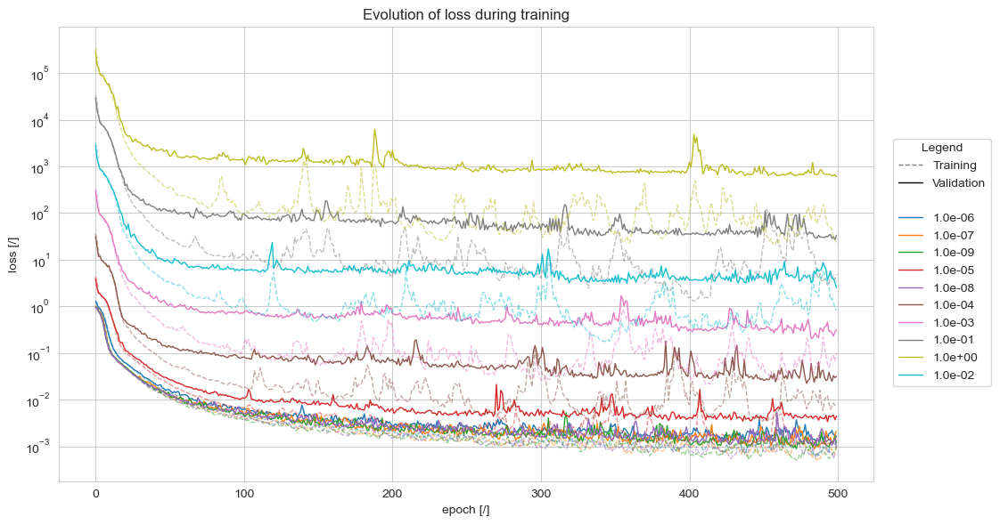

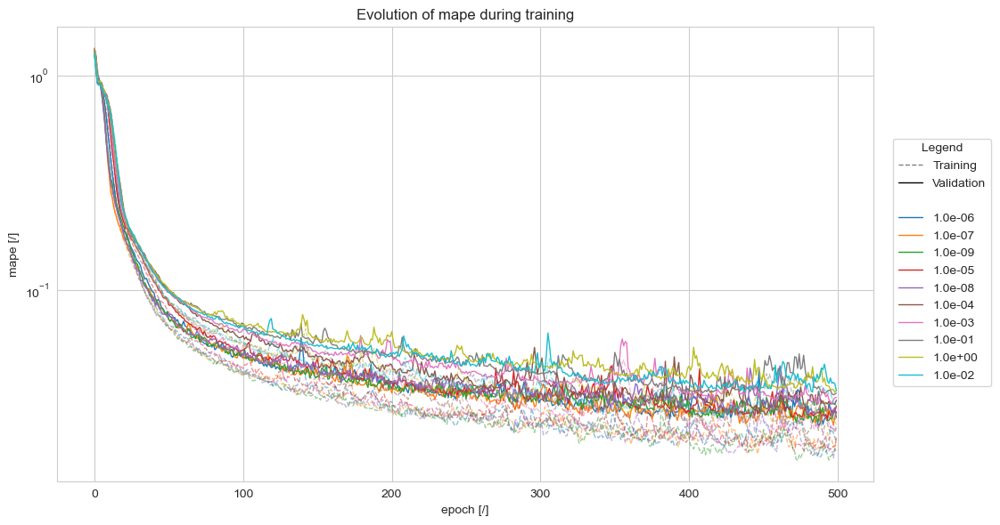

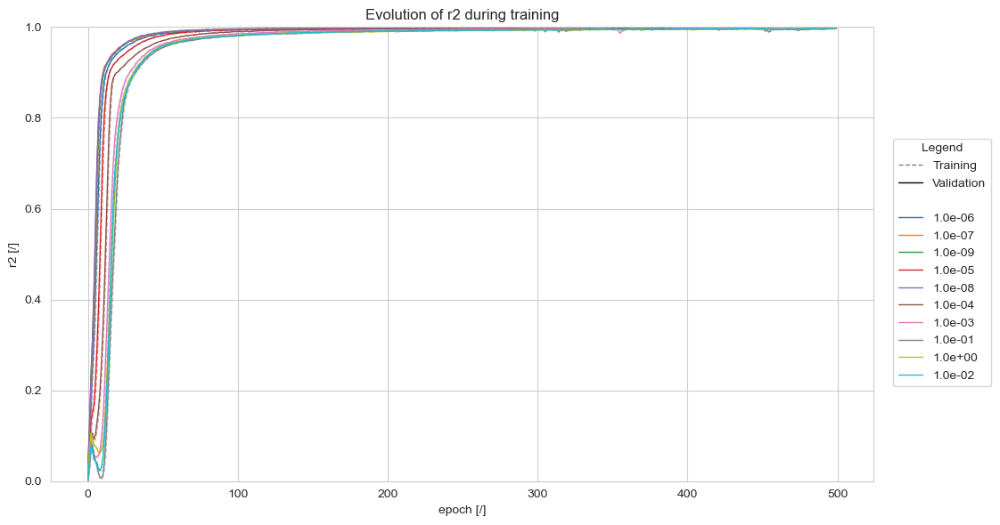

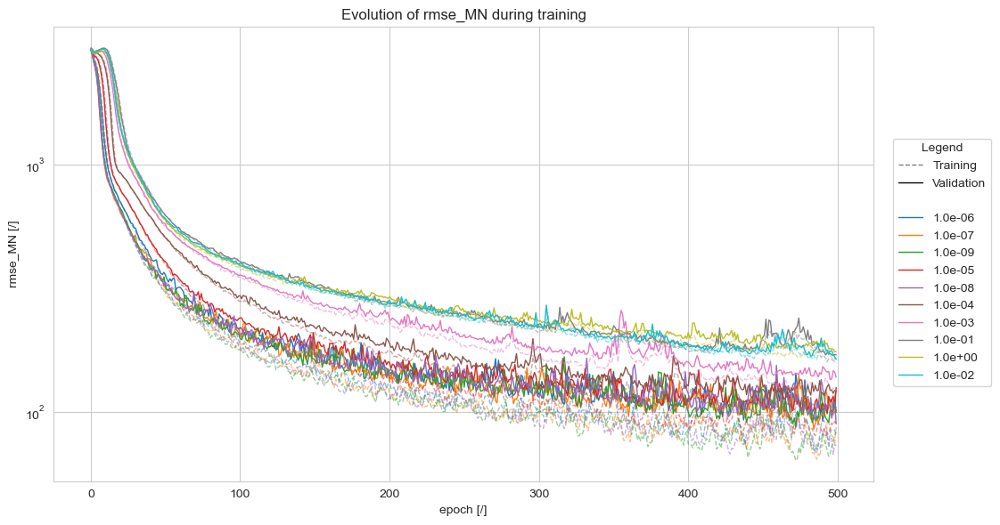

In [13]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{float(c):.1e}" for c in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(0, 1))
plot(results, configs, 'rmse_MN', labels)

In [14]:
best_f_pinn = 1e-6

### Model capacity

In [15]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("model_capacity")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 200
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

n_layers_values = [2, 3, 4, 5]
n_neurons_values = [65, 70, 80, 80, 100, 120]
with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for n_layers in n_layers_values:
        for n_neurons in n_neurons_values:
            for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
                hidden_dims = [n_neurons for _ in range(n_layers)]
                train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
                future = executor.submit(trial_routine, None, train,
                                         {
                                             'input_dim': 65,
                                             'hidden_dims': hidden_dims,
                                             'output_dim': 1,
                                             'activation': "relu",
                                             'activation_params': None,
                                             'dropout': 0.0,
                                             'batch_norm': False,
                                             'layer_norm': False,
                                             'normalization_params': None,
                                             'output_activation': None,
                                             'output_activation_params': None,
                                         },
                                         train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                         N_EPOCH,
                                         torch.optim.Adam, LR, nn.MSELoss, StiffnessToLoadLoss, best_f_pinn,
                                         kfold, log_step, {'loss': 'mse + pinn'})
                futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run debonair-mare-14 at: http://127.0.0.1:5001/#/experiments/210863443071476398/runs/09dda71e678e4fadba014ac4f2ae55a3
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/210863443071476398
🏃 View run useful-skink-325 at: http://127.0.0.1:5001/#/experiments/210863443071476398/runs/634e21da43b94f08b6a822219f72c637
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/210863443071476398
🏃 View run ambitious-crab-9 at: http://127.0.0.1:5001/#/experiments/210863443071476398/runs/92a29bd8e6db4606885bf96dc2cf6936
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/210863443071476398
🏃 View run nosy-auk-837 at: http://127.0.0.1:5001/#/experiments/210863443071476398/runs/e733a02d7566492daf5e27b1432e82f4
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/210863443071476398
🏃 View run skillful-sponge-601 at: http://127.0.0.1:5001/#/experiments/210863443071476398/runs/2c37fd1506464c2baffdf811e3592937
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/2108634430

In [16]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("model_capacity")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss']=='mse + pinn']

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

layers_combinations = set()
for n_layers in runs_df['params.n_hidden_layers'].unique():
    for layer_size in runs_df['params.hidden_layers_size'].unique():
        layers_combinations.add((n_layers, layer_size))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in layers_combinations}
for n, size in layers_combinations:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse + pinn') &
        (runs_df['params.n_hidden_layers'] == n) &
        (runs_df['params.hidden_layers_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[(n, size)][metric_name].append(
                [metric.value for metric in client.get_metric_history(run_id, metric_name)])

keys = list(results.keys())
for k in keys:
    vi = results[k].values().__iter__().__next__()
    if len(vi) == 0: del results[k]

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

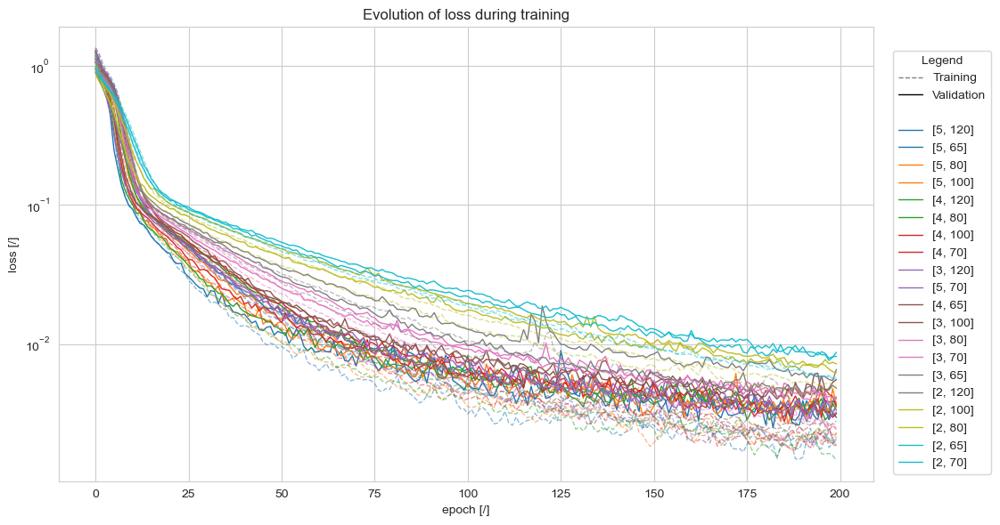

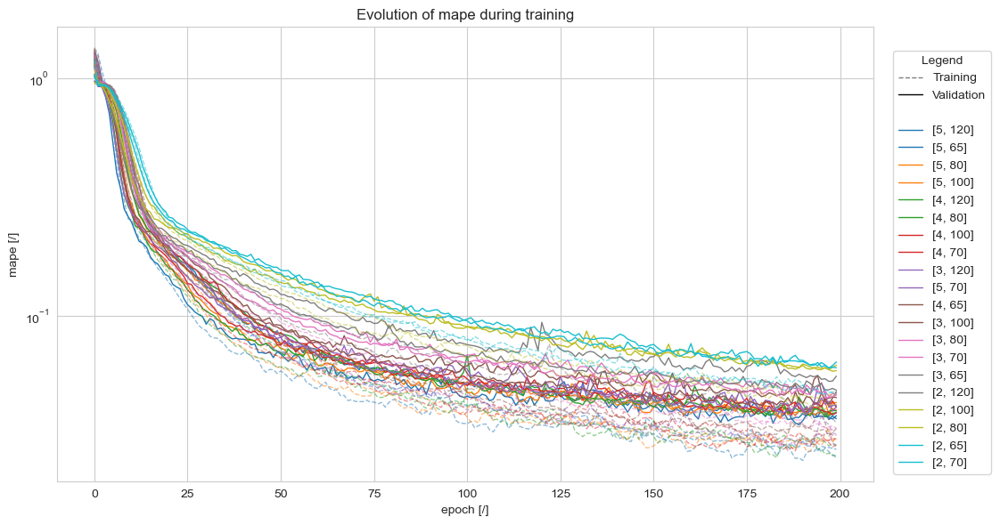

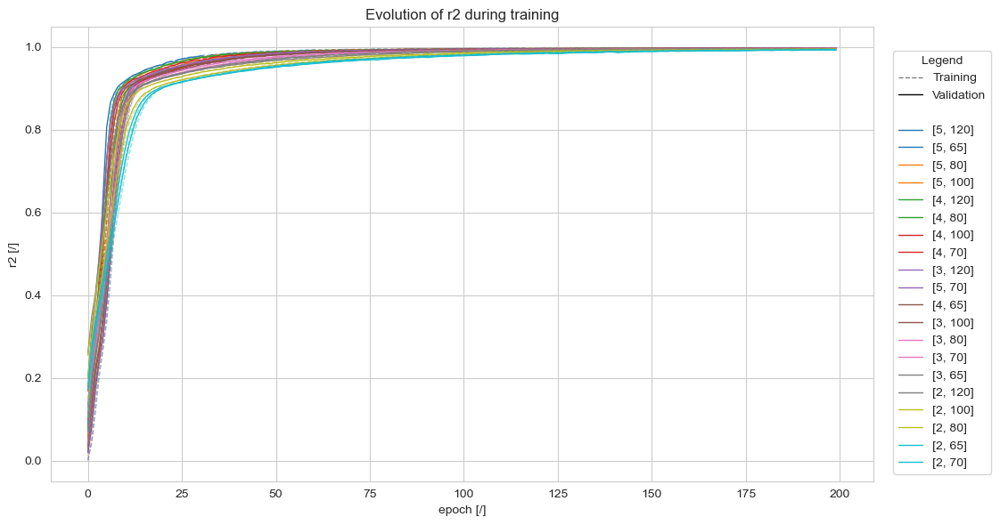

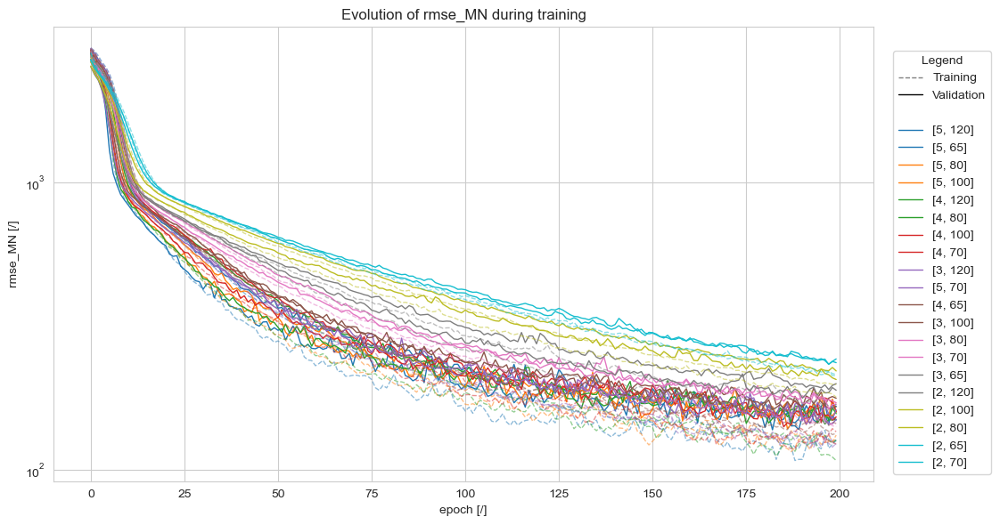

In [17]:
# Your existing code for preparing the data
_configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = _configs
configs = sorted(configs)
configs = [x[1] for x in configs]

labels = [str([int(x) for x in cfg]) for cfg in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

In [18]:
best_hidden_dims = [65 for _ in range(5)]

### Activation function

In [19]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("activation_function")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 100
LR = 5e-4

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

activation_values = ['relu', 'gelu', 'tanh', 'sigmoid',
                     'leaky_relu', 'leaky_relu', 'leaky_relu', 'leaky_relu']
activation_params_values = [None, None, None, None,
                            {'negative_slope': 5e-1}, {'negative_slope': 1e-1}, {'negative_slope': 5e-2},
                            {'negative_slope': 1e-2}]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for activation, activation_params in zip(activation_values, activation_params_values):
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': activation,
                                         'activation_params': activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, nn.MSELoss, StiffnessToLoadLoss, best_f_pinn,
                                     kfold, log_step, {'loss': 'mse + pinn'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run stately-carp-426 at: http://127.0.0.1:5001/#/experiments/627366066998034609/runs/6df93b48ce0142278dc6dc1fb04d8389
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/627366066998034609
🏃 View run clumsy-stoat-814 at: http://127.0.0.1:5001/#/experiments/627366066998034609/runs/446f81b83b4b454aaba74c4c5eb6b1bd
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/627366066998034609
🏃 View run nimble-jay-179 at: http://127.0.0.1:5001/#/experiments/627366066998034609/runs/508a2d6debc24e8494f832e624d06eb8
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/627366066998034609
🏃 View run luminous-wolf-322 at: http://127.0.0.1:5001/#/experiments/627366066998034609/runs/bbd7004dd01547f7952c833e96cad2db
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/627366066998034609
🏃 View run sincere-kit-637 at: http://127.0.0.1:5001/#/experiments/627366066998034609/runs/d4b5674d05884a109e16714cf28a0408
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/62736606699

In [20]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("activation_function")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

activations_combinations = set()
for m in runs_df['params.activation'].unique():
    for n in runs_df[runs_df['params.activation'] == m]['params.activation_params'].unique():
        activations_combinations.add((m, n))

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in activations_combinations}
for k in activations_combinations:
    (act, params) = k
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse + pinn') &
        (runs_df['params.activation'] == act) &
        (runs_df['params.activation_params'] == params)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[k][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

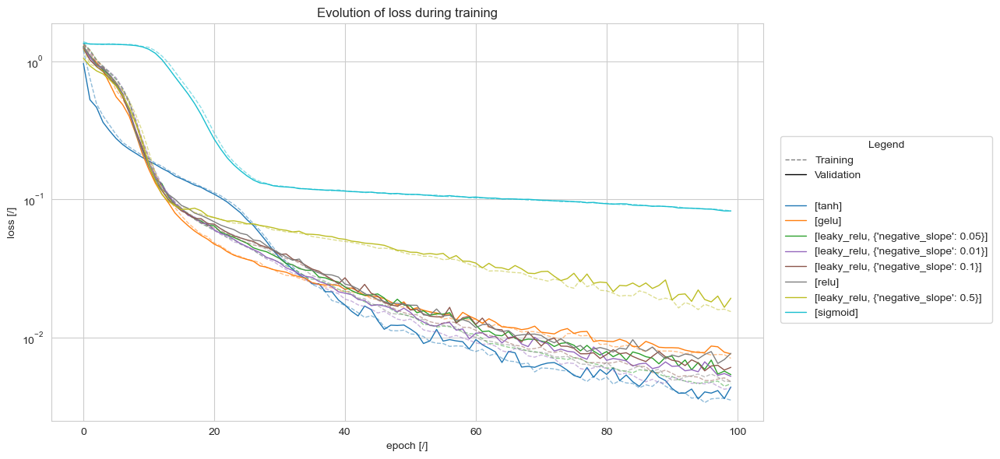

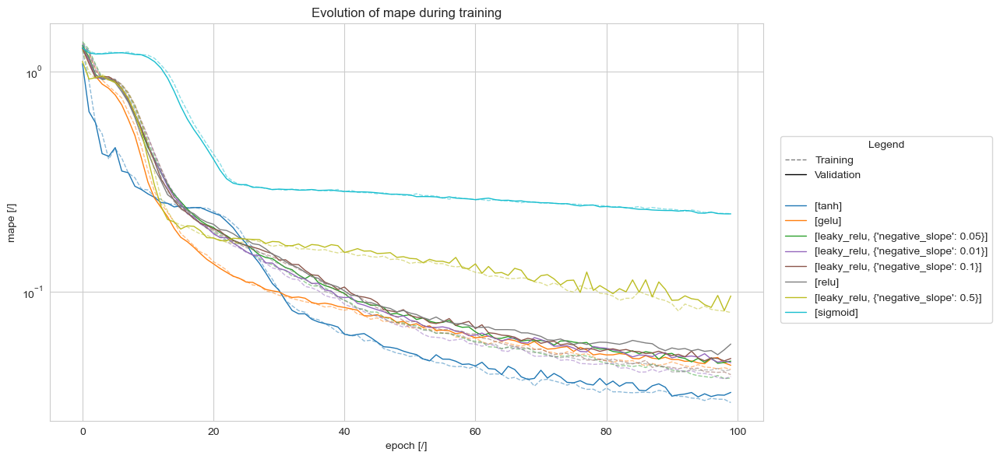

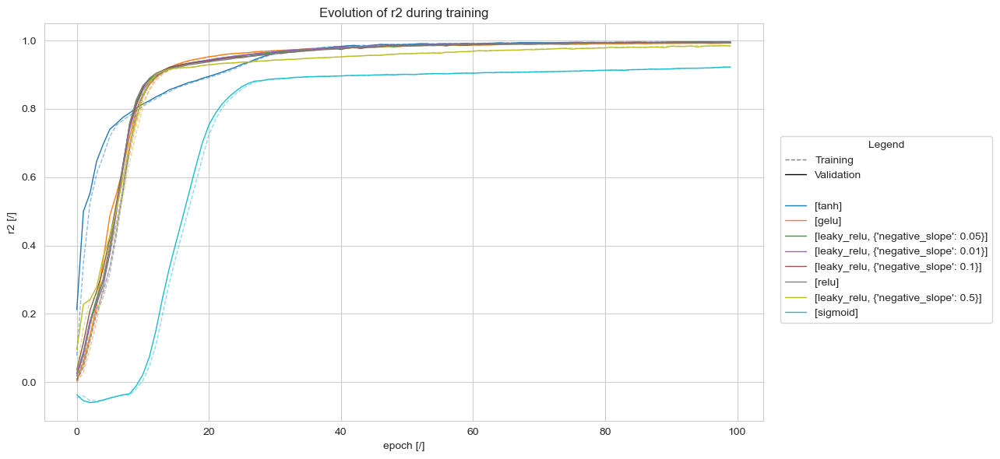

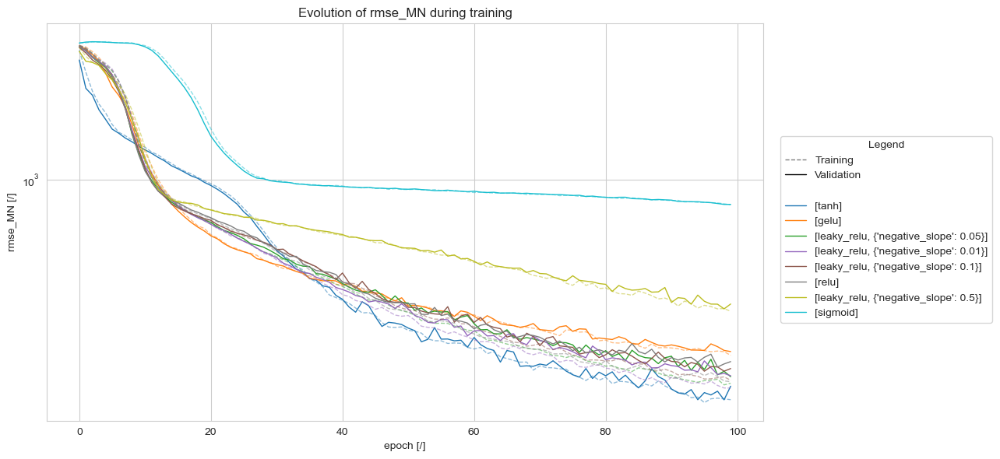

In [21]:
# Your existing code for preparing the data
configs = [x[1] for x in sorted([(np.min(v['val_mape']), k) for k, v in results.items()])]
labels = [f"[{cfg[0]}]" if cfg[1] == 'None' else f"[{cfg[0]}, {cfg[1]}]" for cfg in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False)
plot(results, configs, 'rmse_MN', labels)

In [22]:
best_activation = 'tanh'
best_activation_params = None

### Learning rate

In [32]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("learning_rate")

TRAIN_BATCH_SIZE = 512
VAL_BATCH_SIZE = 512

N_EPOCH = 100
lr_values = sorted(np.hstack([f * np.logspace(-5, -3, 3) for f in [1, 5]]))

log_step = -1

kfold = 10
dataset_path = "data/dataset/pratt_truss_bridge/single_ea/train_4096.hdf5"
ds = FixedPrattTrussDatasetSingleTarget(dataset_path)

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for LR in lr_values:
        for fold, (train_idx, val_idx) in enumerate(KFold(n_splits=kfold, shuffle=True).split(ds)):
            train_dataset, validation_dataset = Subset(ds, train_idx), Subset(ds, val_idx)
            future = executor.submit(trial_routine, None, train,
                                     {
                                         'input_dim': 65,
                                         'hidden_dims': best_hidden_dims,
                                         'output_dim': 1,
                                         'activation': best_activation,
                                         'activation_params': best_activation_params,
                                         'dropout': 0.0,
                                         'batch_norm': False,
                                         'layer_norm': False,
                                         'normalization_params': None,
                                         'output_activation': None,
                                         'output_activation_params': None,
                                     },
                                     train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                     N_EPOCH,
                                     torch.optim.Adam, LR, nn.MSELoss, StiffnessToLoadLoss, best_f_pinn,
                                     kfold, log_step, {'loss': 'mse + pinn'})
            futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run wistful-fowl-432 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/d4ad175ee95141af962f9a7d66882d5d
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run powerful-fox-554 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/53dad1cda5ec4067ac3c6b0c7abfec62
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run incongruous-bird-484 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/6ef2d1cea19844518a6692948d89d2f6
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run agreeable-smelt-485 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/4c42c88f023648de9d2531015a97ca87
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/361763975221534637
🏃 View run valuable-crab-836 at: http://127.0.0.1:5001/#/experiments/361763975221534637/runs/f20a443517c543568d391b751d2b4e09
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/3

In [35]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("learning_rate")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss'] == 'mse + pinn']

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

learning_rates = set(runs_df['params.learning_rate'].unique())

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in learning_rates}
for lr in learning_rates:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse + pinn') &
        (runs_df['params.learning_rate'] == lr)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[lr][metric_name].append([metric.value for metric in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

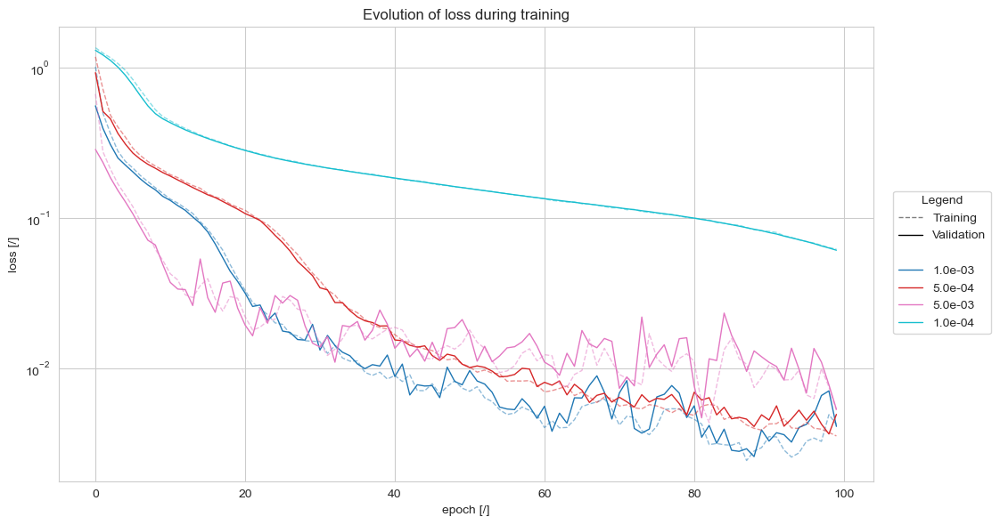

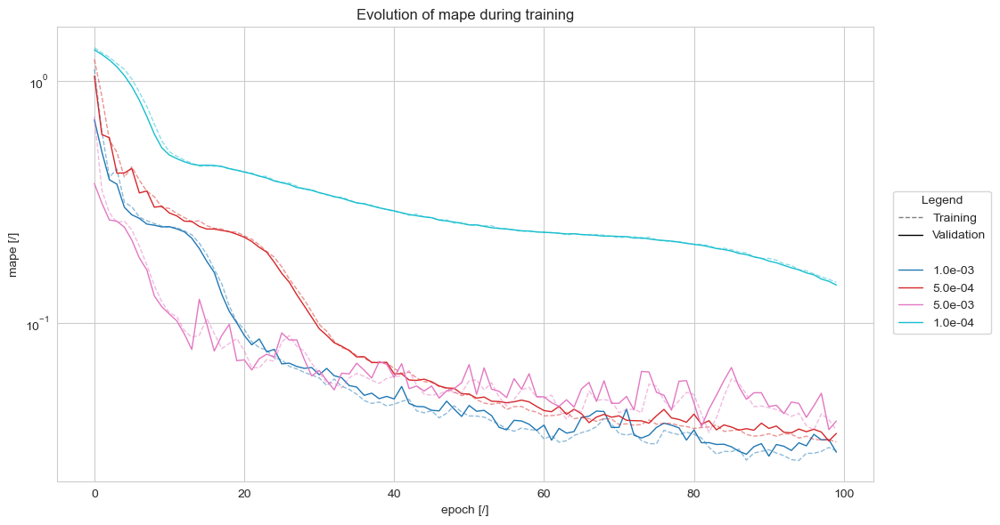

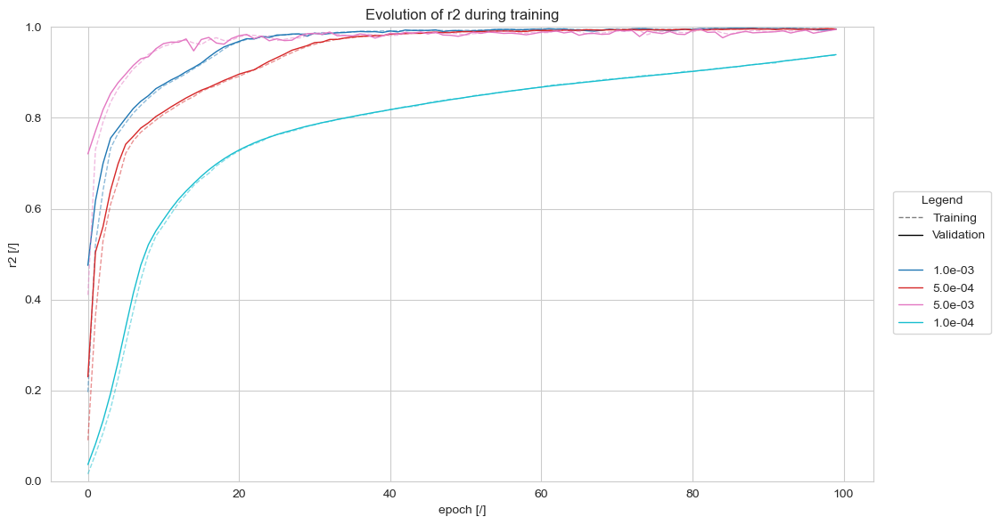

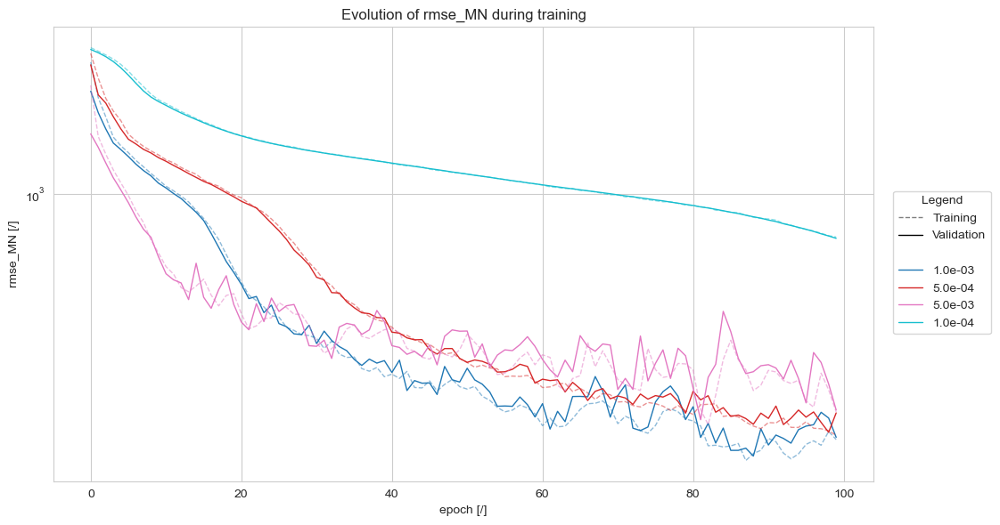

In [36]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs][:4]

labels = [f"{float(c):.1e}" for c in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(0, 1))
plot(results, configs, 'rmse_MN', labels)

In [37]:
best_lr = 5e-4

### Training

In [38]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("training")

VAL_BATCH_SIZE = 8192
N_EPOCH = 1_000
log_step = -1

sizes = [2 ** i for i in range(8, 15)]
batch_size_values = [512 for _ in sizes]  # [int(min(np.power(2, np.floor(np.log2(n)) - 1), 512)) for n in sizes]
dataset_path_values = [f"data/dataset/pratt_truss_bridge/single_ea/train_{n}.hdf5" for n in sizes]

with ThreadPoolExecutor(max_workers=5) as executor:
    futures = []
    for i, (dataset_path, TRAIN_BATCH_SIZE) in enumerate(zip(dataset_path_values, batch_size_values)):
        size = sizes[i]
        train_dataset = FixedPrattTrussDatasetSingleTarget(dataset_path)
        validation_dataset = _validation_ds
        future = executor.submit(trial_routine, None, train,
                                 {
                                     'input_dim': 65,
                                     'hidden_dims': best_hidden_dims,
                                     'output_dim': 1,
                                     'activation': best_activation,
                                     'activation_params': best_activation_params,
                                     'dropout': 0.0,
                                     'batch_norm': False,
                                     'layer_norm': False,
                                     'normalization_params': None,
                                     'output_activation': None,
                                     'output_activation_params': None
                                 },
                                 train_dataset, validation_dataset, TRAIN_BATCH_SIZE, VAL_BATCH_SIZE,
                                 N_EPOCH,
                                 torch.optim.Adam, best_lr, nn.MSELoss, StiffnessToLoadLoss, best_f_pinn,
                                 -1, log_step, {'loss': 'mse + pinn', 'noise': 0.})
        futures.append(future)

    # Ensure all processes complete execution
    for future in futures:
        future.result()

🏃 View run exultant-donkey-226 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/c22855a9011941cc879cbf612d7ff6a4
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run silent-shrike-827 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/07d5cc03da2649969ad1b08118c09b56
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run wistful-finch-94 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/1846bfb5bef346cab1878669205f15ea
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run charming-calf-202 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/e61b4c3350ab4a9ea0f079ca1fdf7198
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/942350632732246975
🏃 View run glamorous-vole-144 at: http://127.0.0.1:5001/#/experiments/942350632732246975/runs/f45964abf4bb4f91add30d3210641d2a
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/94

In [39]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")

runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss'] == 'mse + pinn']

cols = [c for c in runs_df if c.startswith('metrics.')]
metrics_names = [col[col.index('.') + 1:] for col in cols]

sizes = set()
for size in runs_df['params.train_size'].unique():
    sizes.add(size)

client = mlflow.tracking.MlflowClient()
results = {k1: {k2: [] for k2 in metrics_names} for k1 in sizes}
for size in sizes:
    run_ids = runs_df[
        (runs_df['params.loss'] == 'mse + pinn') &
        (runs_df['params.train_size'] == size)
        ]['run_id']
    for run_id in run_ids:
        for metric_name in metrics_names:
            results[size][metric_name].append([m.value for m in client.get_metric_history(run_id, metric_name)])

for k in results.keys():
    for metric in results[k].keys():
        results[k][metric] = np.vstack(results[k][metric]).mean(axis=0)

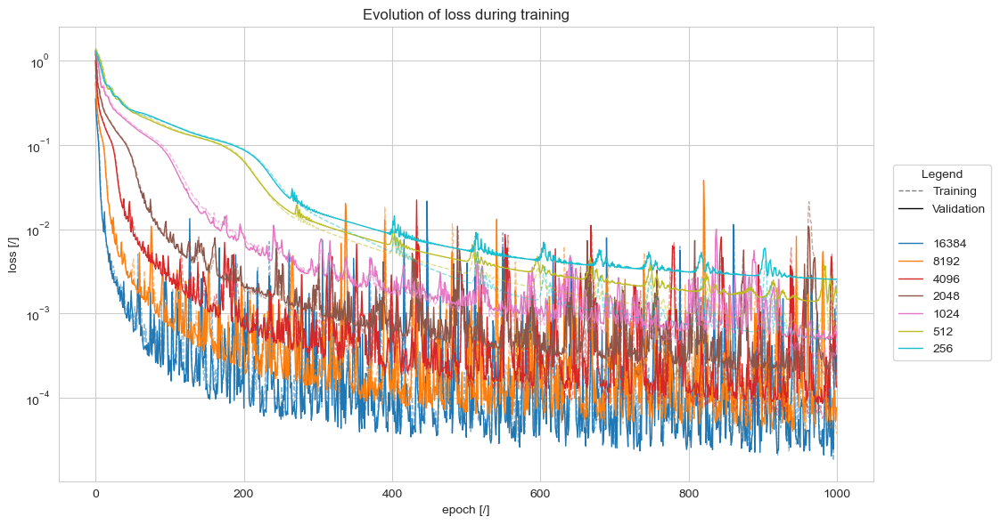

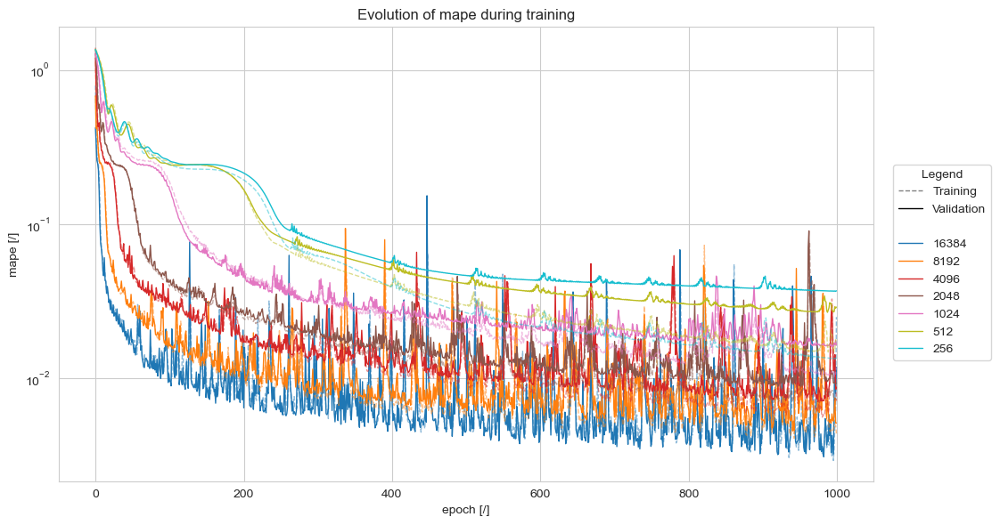

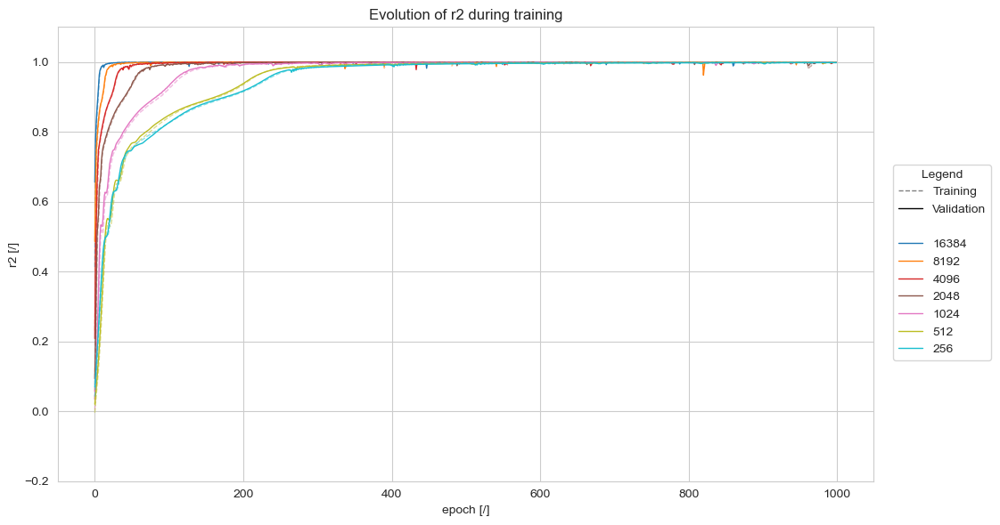

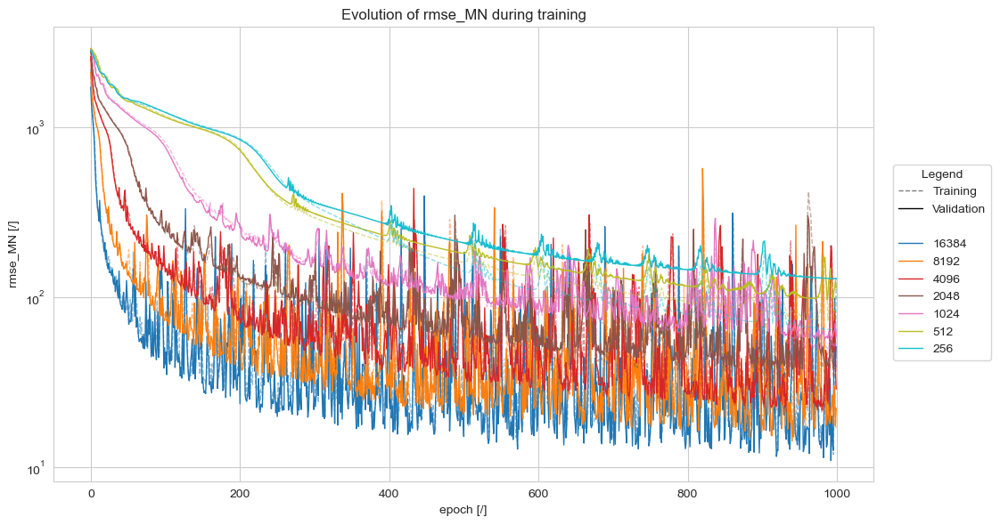

In [40]:
configs = sorted([(np.min(v['val_mape']), k) for k, v in results.items()])
configs = [x[1] for x in configs]

labels = [f"{int(size)}" for size in configs]

plot(results, configs, 'loss', labels)
plot(results, configs, 'mape', labels)
plot(results, configs, 'r2', labels, log=False, ylim=(-.2, 1.1))
plot(results, configs, 'rmse_MN', labels)

### Noise sensitivity

In [45]:
%%capture
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
experiment = mlflow.get_experiment_by_name("training")
runs_df = mlflow.search_runs(experiment_ids=[experiment.experiment_id])
runs_df = runs_df[runs_df['params.loss'] == 'mse + pinn']

results = []

for f in np.linspace(0, .1, 6):
    validation_ds = FixedPrattTrussDatasetSingleTarget(
        "data/dataset/pratt_truss_bridge/test/single_8192.hdf5",
        f_noise_length=None,
        f_noise_loads=lambda size: np.random.normal(1, f / 4, size=size),
        f_noise_strain=lambda size: np.random.normal(1, f / 4, size=size),
        f_noise_displacement=lambda size: np.random.normal(1, f / 4, size=size),
    )

    dl = DataLoader(validation_ds, batch_size=8192)

    for i in range(len(runs_df[['artifact_uri', 'params.train_size']])):
        artifact_uri = runs_df.iloc[i]['artifact_uri']
        size = runs_df.iloc[i]['params.train_size']

        uri = f"{artifact_uri}/input_scaler/"
        input_scaler = load_model(uri)

        uri = f"{artifact_uri}/target_scaler/"
        target_scaler = load_model(uri)

        uri = f"{artifact_uri}/mape_model/"
        model = load_model(uri)

        for batch in dl:
            metrics = validation(model, batch, input_scaler, target_scaler, F.mse_loss, StiffnessToLoadLoss(), best_f_pinn)
        results.append((size, f, metrics))

In [46]:
mlflow.set_tracking_uri(uri=MLFLOW_URI(port=PORT))
mlflow.set_experiment("noise_sensitivity")

df = pd.DataFrame([[results[i][0], results[i][1],
                    results[i][2]['r2'].item(),
                    results[i][2]['mape'].item(),
                    results[i][2]['rmse_MN'].item(),
                    results[i][2]['loss']]
                   for i in range(len(results))], columns=['train_size', 'noise', 'r2', 'mape', 'rmse_MN', 'loss'])
df.sort_values(by=['train_size', 'noise'], axis=0, ignore_index=True, inplace=True)

for size in df.train_size.unique():
    with mlflow.start_run():
        df_2 = df[df['train_size'] == size]
        # Model information logging
        mlflow.log_params({
            'train_size': size,
            'loss': 'mse + pinn'
        })
        for i in range(len(df_2)):
            mlflow.log_metrics(
                dict(df_2.iloc[i][1:]),
                step=i
            )

🏃 View run bold-moth-123 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/f2784ce27dcd4783bc53e71f5e9fde18
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run rambunctious-rat-669 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/5b79a373c10741c5bd6e22756c606918
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run clean-donkey-843 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/61ebc166aa3d42cdb44622997e4a6980
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run judicious-gnu-3 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/ef5c3cb144384582b0bc841002179b68
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/238767268806225998
🏃 View run gaudy-skink-898 at: http://127.0.0.1:5001/#/experiments/238767268806225998/runs/29761f7a396e4059a86698ffd8cf63f7
🧪 View experiment at: http://127.0.0.1:5001/#/experiments/2387672688